##Part A: Designing and Analyzing Convolutional Neural Networks from Scratch

##### This section focuses on building and evaluating CNN models from scratch for brain tumor classification using MRI images. A baseline CNN and a deeper architecture with regularization are developed and compared. Different optimizers and architectural choices are analyzed using performance metrics such as accuracy, precision, recall, and F1-score to study model learning, generalization, and overfitting behavior.

In [2]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os
import zipfile

In [4]:
# Dataset ZIP Path
zip_path = "/content/drive/MyDrive/Brain Tumor Classifcation-20260415T175658Z-3-001.zip"

In [5]:
# Extraction Directory
extract_path = "/content/brain_tumor_dataset"


In [6]:
# Create extraction folder if not exists
os.makedirs(extract_path, exist_ok=True)

In [7]:
# Unzip Dataset
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Dataset extracted successfully!")
print(f"Dataset location: {extract_path}")

Dataset extracted successfully!
Dataset location: /content/brain_tumor_dataset


In [8]:
print("\nFolders inside dataset:\n")

for item in os.listdir(extract_path):
    print(item)


Folders inside dataset:

Brain Tumor Classifcation


# Import libraries

In [9]:
# Import libraries for file and directory handling
import os
import random
import hashlib

# Import libraries for numerical computation and data analysis
import numpy as np
import pandas as pd

# Import visualization libraries for exploratory data analysis
import matplotlib.pyplot as plt
import seaborn as sns

# Import image processing libraries
from PIL import Image, ImageFile

# Import TensorFlow and Keras libraries for deep learning and preprocessing
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Import utility for handling class imbalance
from sklearn.utils.class_weight import compute_class_weight

# Allow loading of truncated or partially corrupted image files
ImageFile.LOAD_TRUNCATED_IMAGES = True

In [10]:
dataset_path = "/content/brain_tumor_dataset/Brain Tumor Classifcation"

# Define training and testing folder paths
train_path = os.path.join(dataset_path, "train")
test_path = os.path.join(dataset_path, "test")

# Get the list of class names from the training folder
classes = sorted(os.listdir(train_path))

# Display dataset information
print("Dataset Path:")
print(dataset_path)

print("\nTraining Path:")
print(train_path)

print("\nTesting Path:")
print(test_path)

print("\nClasses Found:")
print(classes)

Dataset Path:
/content/brain_tumor_dataset/Brain Tumor Classifcation

Training Path:
/content/brain_tumor_dataset/Brain Tumor Classifcation/train

Testing Path:
/content/brain_tumor_dataset/Brain Tumor Classifcation/test

Classes Found:
['glioma_tumor', 'meningioma_tumor', 'normal', 'pituitary_tumor']


In [11]:
# Count images in each class
def count_images_by_class(folder_path, class_names):
    counts = {}

    for class_name in class_names:
        class_path = os.path.join(folder_path, class_name)

        image_files = [
            file for file in os.listdir(class_path)
            if file.lower().endswith((".jpg", ".jpeg", ".png"))
        ]

        counts[class_name] = len(image_files)

    return counts


train_counts = count_images_by_class(train_path, classes)
test_counts = count_images_by_class(test_path, classes)

In [12]:
# Create dataframe for dataset summary
eda_df = pd.DataFrame({
    "Class": classes,
    "Train Images": [train_counts[class_name] for class_name in classes],
    "Test Images": [test_counts[class_name] for class_name in classes]
})

eda_df["Total Images"] = eda_df["Train Images"] + eda_df["Test Images"]

# Display dataset statistics
print(eda_df)

print("\nTotal Training Images:", eda_df["Train Images"].sum())
print("Total Testing Images:", eda_df["Test Images"].sum())
print("Total Images:", eda_df["Total Images"].sum())

              Class  Train Images  Test Images  Total Images
0      glioma_tumor           720          181           901
1  meningioma_tumor           730          183           913
2            normal           350           88           438
3   pituitary_tumor           675          169           844

Total Training Images: 2475
Total Testing Images: 621
Total Images: 3096


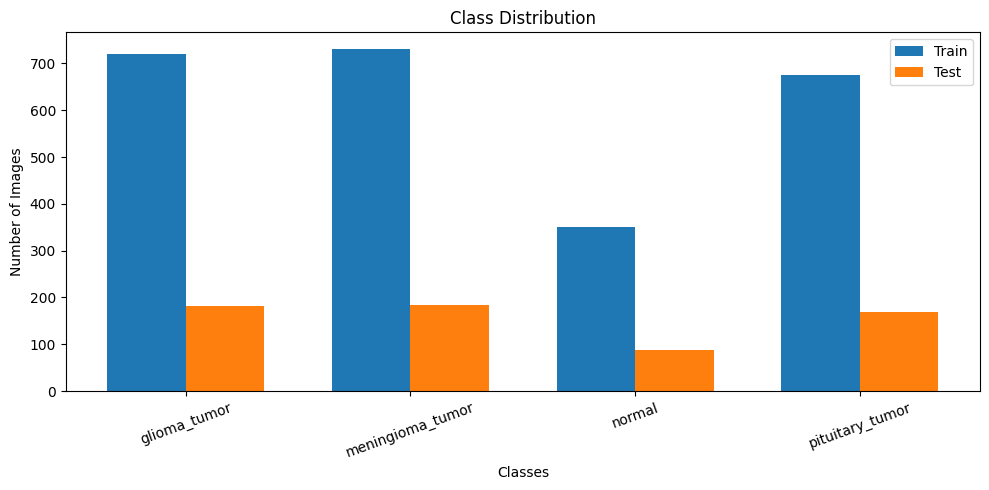

In [13]:
# Visualize class distribution
plt.figure(figsize=(10, 5))

x = np.arange(len(classes))
width = 0.35

plt.bar(x - width / 2, eda_df["Train Images"], width, label="Train")
plt.bar(x + width / 2, eda_df["Test Images"], width, label="Test")

plt.xticks(x, classes, rotation=20)
plt.xlabel("Classes")
plt.ylabel("Number of Images")
plt.title("Class Distribution")

plt.legend()
plt.tight_layout()
plt.show()

In [14]:
# Check class imbalance
total_per_class = eda_df["Total Images"].values

imbalance_ratio = total_per_class.max() / total_per_class.min()

largest_class = eda_df.loc[
    eda_df["Total Images"].idxmax(),
    "Class"
]

smallest_class = eda_df.loc[
    eda_df["Total Images"].idxmin(),
    "Class"
]

print("Largest Class:", largest_class)
print("Smallest Class:", smallest_class)
print("Imbalance Ratio:", round(imbalance_ratio, 2), ": 1")

Largest Class: meningioma_tumor
Smallest Class: normal
Imbalance Ratio: 2.08 : 1


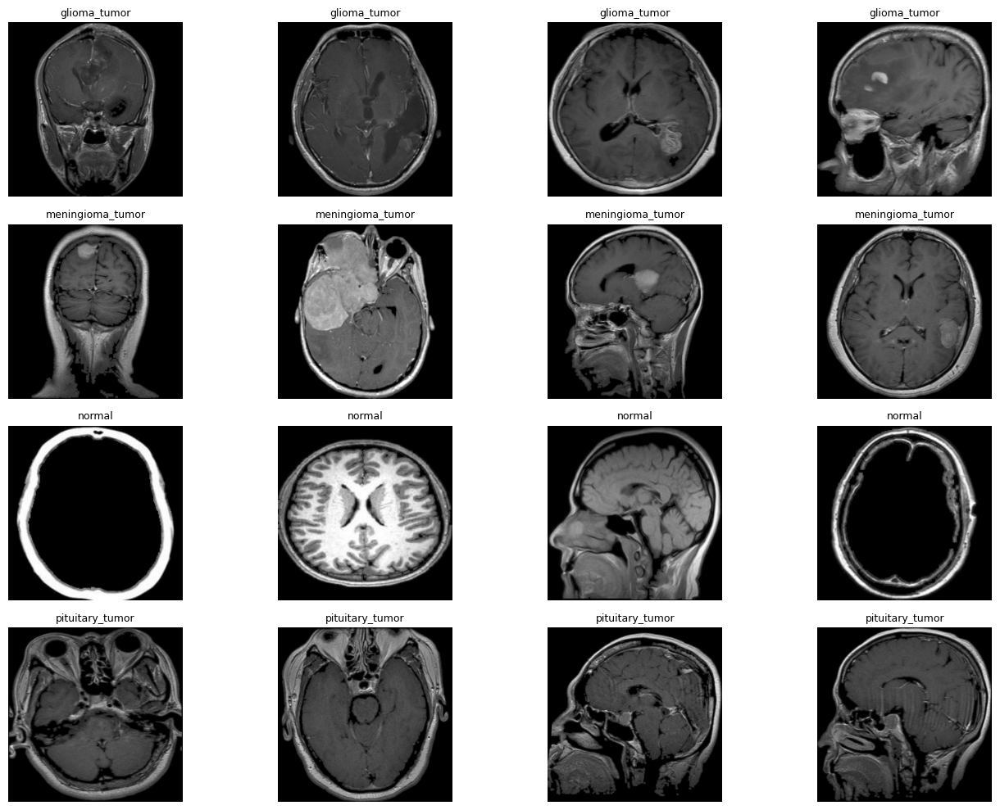

In [15]:
# Display sample MRI images from each class
def show_sample_images(folder_path, class_names, samples_per_class=4):

    plt.figure(figsize=(14, 10))

    plot_index = 1

    for class_name in class_names:

        class_path = os.path.join(folder_path, class_name)

        image_files = [
            file for file in os.listdir(class_path)
            if file.lower().endswith((".jpg", ".jpeg", ".png"))
        ]

        selected_files = random.sample(
            image_files,
            min(samples_per_class, len(image_files))
        )

        for image_file in selected_files:

            image_path = os.path.join(class_path, image_file)

            image = Image.open(image_path).convert("RGB")

            plt.subplot(
                len(class_names),
                samples_per_class,
                plot_index
            )

            plt.imshow(image)
            plt.title(class_name, fontsize=9)
            plt.axis("off")

            plot_index += 1

    plt.tight_layout()
    plt.show()


show_sample_images(train_path, classes)

In [16]:
# Check image dimensions and color modes
image_info = []

for class_name in classes:

    class_path = os.path.join(train_path, class_name)

    image_files = os.listdir(class_path)[:50]

    for image_file in image_files:

        image_path = os.path.join(class_path, image_file)

        try:
            image = Image.open(image_path)

            width, height = image.size

            image_info.append([
                class_name,
                width,
                height,
                image.mode
            ])

        except:
            pass


size_df = pd.DataFrame(
    image_info,
    columns=["Class", "Width", "Height", "Mode"]
)

print(size_df.head())

print("\nImage Size Distribution:")
print(
    size_df.groupby(["Width", "Height"])
    .size()
    .sort_values(ascending=False)
)

print("\nImage Color Modes:")
print(size_df["Mode"].value_counts())

          Class  Width  Height Mode
0  glioma_tumor    256     256  RGB
1  glioma_tumor    256     256  RGB
2  glioma_tumor    256     256  RGB
3  glioma_tumor    256     256  RGB
4  glioma_tumor    256     256  RGB

Image Size Distribution:
Width  Height
256    256       198
dtype: int64

Image Color Modes:
Mode
RGB    198
Name: count, dtype: int64


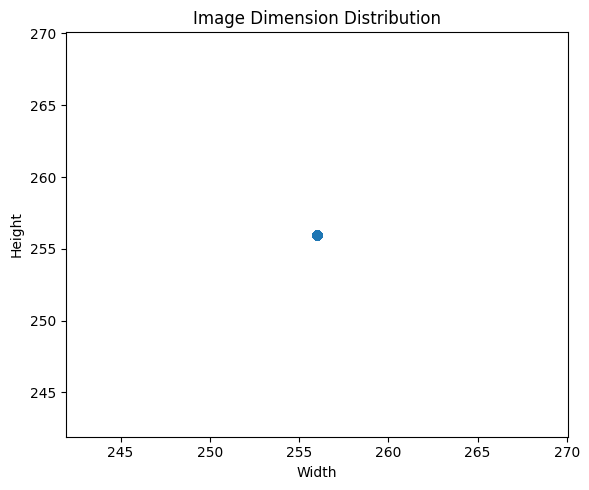

In [17]:
# Visualize image size distribution
plt.figure(figsize=(6, 5))

plt.scatter(size_df["Width"], size_df["Height"])

plt.xlabel("Width")
plt.ylabel("Height")
plt.title("Image Dimension Distribution")

plt.tight_layout()
plt.show()

In [18]:
# Detect corrupted images
corrupted_images = []

for folder in [train_path, test_path]:

    for class_name in classes:

        class_path = os.path.join(folder, class_name)

        image_files = os.listdir(class_path)

        for image_file in image_files:

            image_path = os.path.join(class_path, image_file)

            try:
                image = Image.open(image_path)
                image.verify()

            except:
                corrupted_images.append(image_path)


print("Total Corrupted Images:", len(corrupted_images))

Total Corrupted Images: 28


In [19]:
# Detect duplicate images using file hash
duplicate_hashes = {}
duplicate_images = []

for folder in [train_path, test_path]:

    for class_name in classes:

        class_path = os.path.join(folder, class_name)

        image_files = os.listdir(class_path)

        for image_file in image_files:

            image_path = os.path.join(class_path, image_file)

            try:
                with open(image_path, "rb") as file:
                    file_hash = hashlib.md5(file.read()).hexdigest()

                if file_hash in duplicate_hashes:
                    duplicate_images.append(image_path)

                else:
                    duplicate_hashes[file_hash] = image_path

            except:
                pass


print("Total Duplicate Images:", len(duplicate_images))

Total Duplicate Images: 244


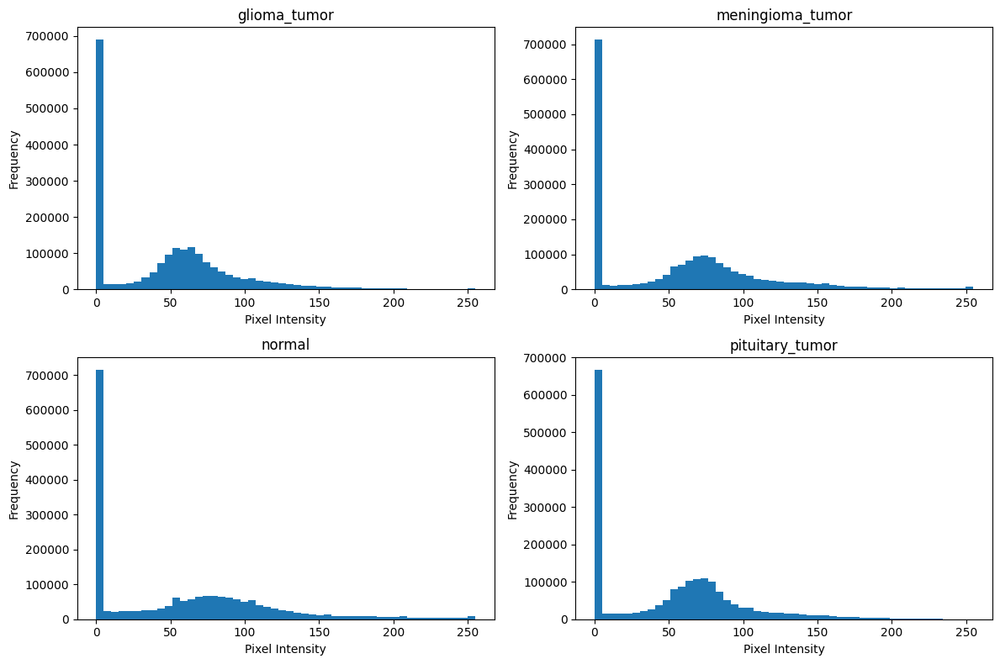

In [20]:
# Plot pixel intensity distribution
plt.figure(figsize=(12, 8))

for index, class_name in enumerate(classes):

    class_path = os.path.join(train_path, class_name)

    image_files = os.listdir(class_path)[:30]

    pixel_values = []

    for image_file in image_files:

        image_path = os.path.join(class_path, image_file)

        try:
            image = Image.open(image_path).convert("L")

            image_array = np.array(image)

            pixel_values.extend(image_array.flatten())

        except:
            pass

    plt.subplot(2, 2, index + 1)

    plt.hist(pixel_values, bins=50)

    plt.title(class_name)
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")


plt.tight_layout()
plt.show()

In [21]:
# Remove corrupted and duplicate images
removed_files = []

for image_path in corrupted_images:

    if os.path.exists(image_path):

        os.remove(image_path)

        removed_files.append(image_path)


for image_path in duplicate_images:

    if os.path.exists(image_path):

        os.remove(image_path)

        removed_files.append(image_path)


print("Total Removed Files:", len(removed_files))

Total Removed Files: 272


In [22]:
# Recount images after cleaning
train_counts_after = count_images_by_class(train_path, classes)
test_counts_after = count_images_by_class(test_path, classes)

cleaned_df = pd.DataFrame({
    "Class": classes,
    "Train Images": [train_counts_after[class_name] for class_name in classes],
    "Test Images": [test_counts_after[class_name] for class_name in classes]
})

cleaned_df["Total Images"] = cleaned_df["Train Images"] + cleaned_df["Test Images"]

print(cleaned_df)

print("\nFinal Training Images:", cleaned_df["Train Images"].sum())
print("Final Testing Images:", cleaned_df["Test Images"].sum())
print("Final Total Images:", cleaned_df["Total Images"].sum())

              Class  Train Images  Test Images  Total Images
0      glioma_tumor           701          177           878
1  meningioma_tumor           668          144           812
2            normal           259           48           307
3   pituitary_tumor           663          164           827

Final Training Images: 2291
Final Testing Images: 533
Final Total Images: 2824


In [23]:
# Configure image preprocessing and augmentation
image_size = 256
batch_size = 32

train_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    rotation_range=20,
    width_shift_range=0.10,
    height_shift_range=0.10,
    zoom_range=0.10,
    horizontal_flip=True,
    validation_split=0.20
)

validation_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    validation_split=0.20
)

test_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0
)

In [24]:
# Create training, validation, and testing generators
train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode="categorical",
    subset="training",
    shuffle=True
)

validation_generator = validation_datagen.flow_from_directory(
    train_path,
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode="categorical",
    subset="validation",
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode="categorical",
    shuffle=False
)

print("Training Samples:", train_generator.samples)
print("Validation Samples:", validation_generator.samples)
print("Testing Samples:", test_generator.samples)

Found 1835 images belonging to 4 classes.
Found 456 images belonging to 4 classes.
Found 533 images belonging to 4 classes.
Training Samples: 1835
Validation Samples: 456
Testing Samples: 533


In [25]:
# Calculate class weights for imbalanced dataset
class_weights = compute_class_weight(
    class_weight="balanced",
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)

class_weight_dict = dict(enumerate(class_weights))

print("Class Weights:")
print(class_weight_dict)

Class Weights:
{0: np.float64(0.8177361853832442), 1: np.float64(0.8574766355140186), 2: np.float64(2.2055288461538463), 3: np.float64(0.8639359698681732)}


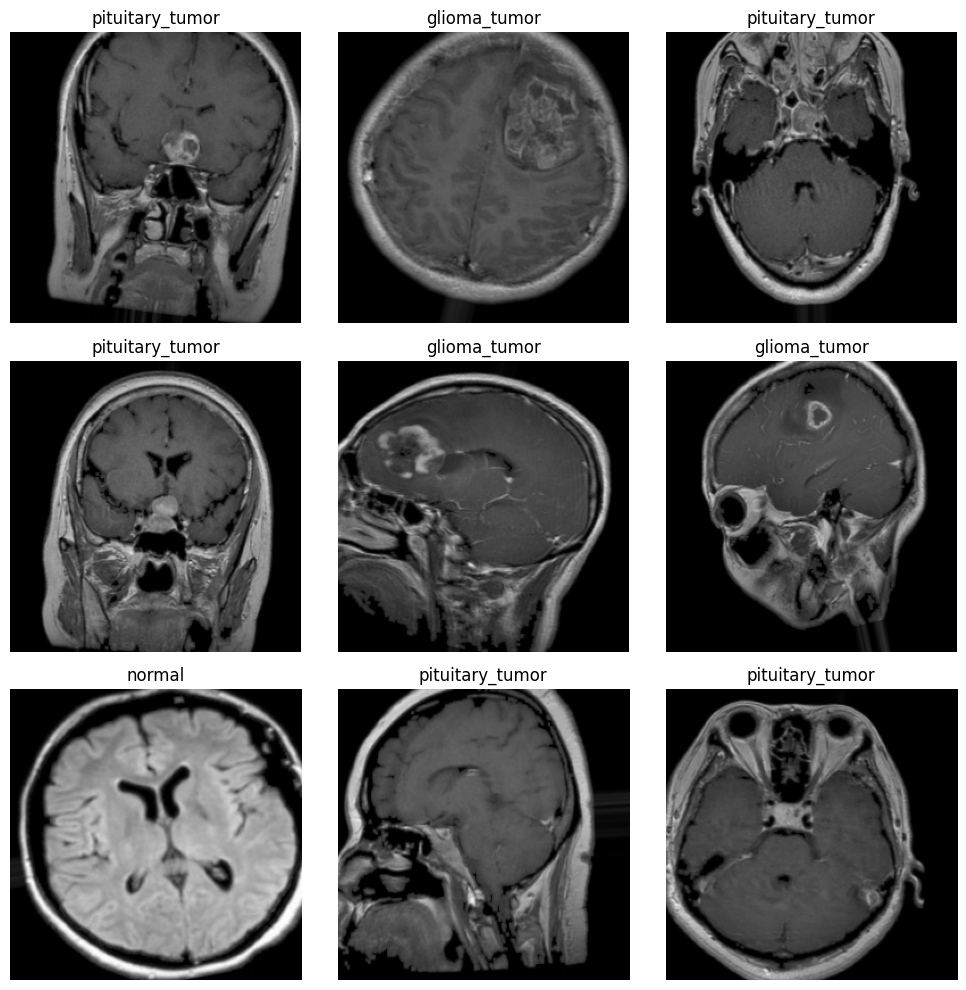

In [26]:
# Visualize augmented training images
images, labels = next(train_generator)

class_names = list(train_generator.class_indices.keys())

plt.figure(figsize=(10, 10))

for i in range(9):

    plt.subplot(3, 3, i + 1)

    plt.imshow(images[i])

    label_index = np.argmax(labels[i])

    plt.title(class_names[label_index])

    plt.axis("off")

plt.tight_layout()
plt.show()

In [27]:
# Define input shape and number of classes
input_shape = (image_size, image_size, 3)

num_classes = train_generator.num_classes

print("Input Shape:", input_shape)
print("Number of Classes:", num_classes)

Input Shape: (256, 256, 3)
Number of Classes: 4


In [28]:
# Import libraries for building CNN models
from tensorflow.keras.models import Sequential

from tensorflow.keras.layers import (
    Conv2D,
    MaxPooling2D,
    Flatten,
    Dense
)

from tensorflow.keras.optimizers import Adam

In [29]:
# Build baseline CNN model
baseline_model = Sequential([

    Conv2D(32, (3, 3), activation="relu", input_shape=input_shape),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(64, (3, 3), activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(128, (3, 3), activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),

    Dense(128, activation="relu"),
    Dense(64, activation="relu"),
    Dense(32, activation="relu"),

    Dense(num_classes, activation="softmax")
])

# Display model architecture
baseline_model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 30, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 115200)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    14,745,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4)              │           132 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,849,444 (56.65 MB)

 Trainable params: 14,849,444 (56.65 MB)

 Non-trainable params: 0 (0.00 B)

In [30]:
# Compile baseline CNN model
baseline_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print("Baseline CNN model compiled successfully.")

Baseline CNN model compiled successfully.


In [31]:
# Import callbacks for better training control
from tensorflow.keras.callbacks import (
    EarlyStopping,
    ReduceLROnPlateau
)
from tensorflow.keras.callbacks import ModelCheckpoint

In [32]:
# Define training callbacks
early_stopping = EarlyStopping(
    monitor="val_loss",
    patience=5,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.5,
    patience=3,
    verbose=1
)

model_checkpoint = ModelCheckpoint(
    "baseline_best_model.keras",
    monitor="val_accuracy",
    save_best_only=True,
    verbose=1
)

callbacks = [
    early_stopping,
    reduce_lr,
    model_checkpoint
]

In [33]:
# Train baseline CNN model
epochs = 30

baseline_history = baseline_model.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    class_weight=class_weight_dict,
    callbacks=callbacks
)

Epoch 1/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 581ms/step - accuracy: 0.2135 - loss: 1.4691
Epoch 1: val_accuracy improved from None to 0.26316, saving model to baseline_best_model.keras

Epoch 1: finished saving model to baseline_best_model.keras
58/58 ━━━━━━━━━━━━━━━━━━━━ 50s 691ms/step - accuracy: 0.2360 - loss: 1.4037 - val_accuracy: 0.2632 - val_loss: 1.3854 - learning_rate: 0.0010
Epoch 2/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 510ms/step - accuracy: 0.2595 - loss: 1.3578
Epoch 2: val_accuracy improved from 0.26316 to 0.30702, saving model to baseline_best_model.keras

Epoch 2: finished saving model to baseline_best_model.keras
58/58 ━━━━━━━━━━━━━━━━━━━━ 31s 538ms/step - accuracy: 0.3248 - loss: 1.3082 - val_accuracy: 0.3070 - val_loss: 1.2275 - learning_rate: 0.0010
Epoch 3/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 509ms/step - accuracy: 0.4629 - loss: 1.1808
Epoch 3: val_accuracy improved from 0.30702 to 0.44737, saving model to baseline_best_model.keras

Epoch 3: finished saving model to baseline_b

In [35]:
# Display best training results
best_epoch = np.argmax(
    baseline_history.history["val_accuracy"]
) + 1

best_val_accuracy = max(
    baseline_history.history["val_accuracy"]
)

best_val_loss = min(
    baseline_history.history["val_loss"]
)

print("Best Epoch:", best_epoch)

print(
    "Best Validation Accuracy:",
    round(best_val_accuracy, 4)
)

print(
    "Best Validation Loss:",
    round(best_val_loss, 4)
)

Best Epoch: 28
Best Validation Accuracy: 0.7873
Best Validation Loss: 0.5921


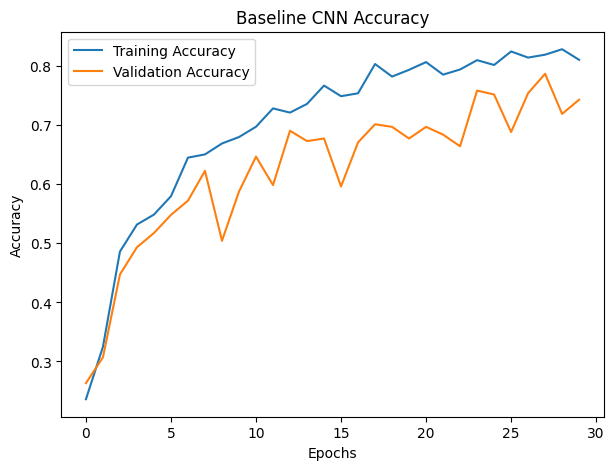

In [36]:
# Plot training and validation accuracy
plt.figure(figsize=(7, 5))

plt.plot(
    baseline_history.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    baseline_history.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Baseline CNN Accuracy")

plt.legend()
plt.show()

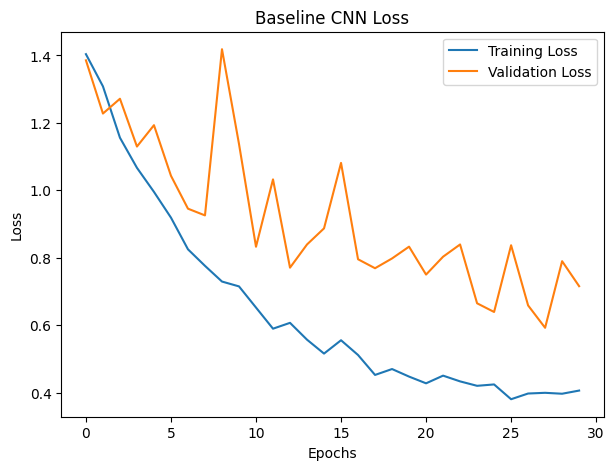

In [38]:
# Plot training and validation loss
plt.figure(figsize=(7, 5))

plt.plot(
    baseline_history.history["loss"],
    label="Training Loss"
)

plt.plot(
    baseline_history.history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Baseline CNN Loss")

plt.legend()
plt.show()

In [40]:
# Import evaluation metrics
from sklearn.metrics import (
    classification_report,
    confusion_matrix
)

In [41]:
# Generate predictions on test dataset
y_pred_probabilities = baseline_model.predict(
    test_generator
)

y_pred = np.argmax(
    y_pred_probabilities,
    axis=1
)

y_true = test_generator.classes

class_names = list(
    test_generator.class_indices.keys()
)

17/17 ━━━━━━━━━━━━━━━━━━━━ 4s 185ms/step


In [42]:
# Display classification metrics
print(
    classification_report(
        y_true,
        y_pred,
        target_names=class_names
    )
)

                  precision    recall  f1-score   support

    glioma_tumor       0.89      0.74      0.81       177
meningioma_tumor       0.73      0.73      0.73       144
          normal       0.85      0.83      0.84        48
 pituitary_tumor       0.83      0.99      0.90       164

        accuracy                           0.82       533
       macro avg       0.83      0.82      0.82       533
    weighted avg       0.83      0.82      0.82       533



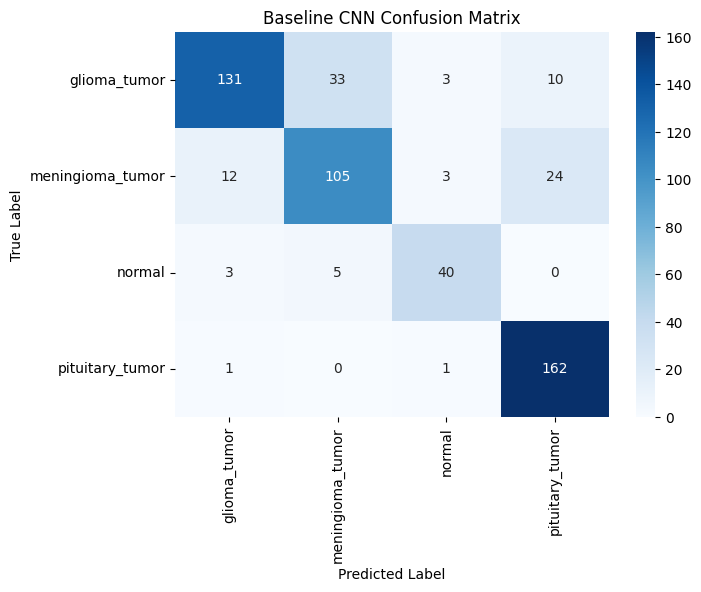

In [43]:
# Plot confusion matrix
conf_matrix = confusion_matrix(
    y_true,
    y_pred
)

plt.figure(figsize=(7, 5))

sns.heatmap(
    conf_matrix,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Baseline CNN Confusion Matrix")

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


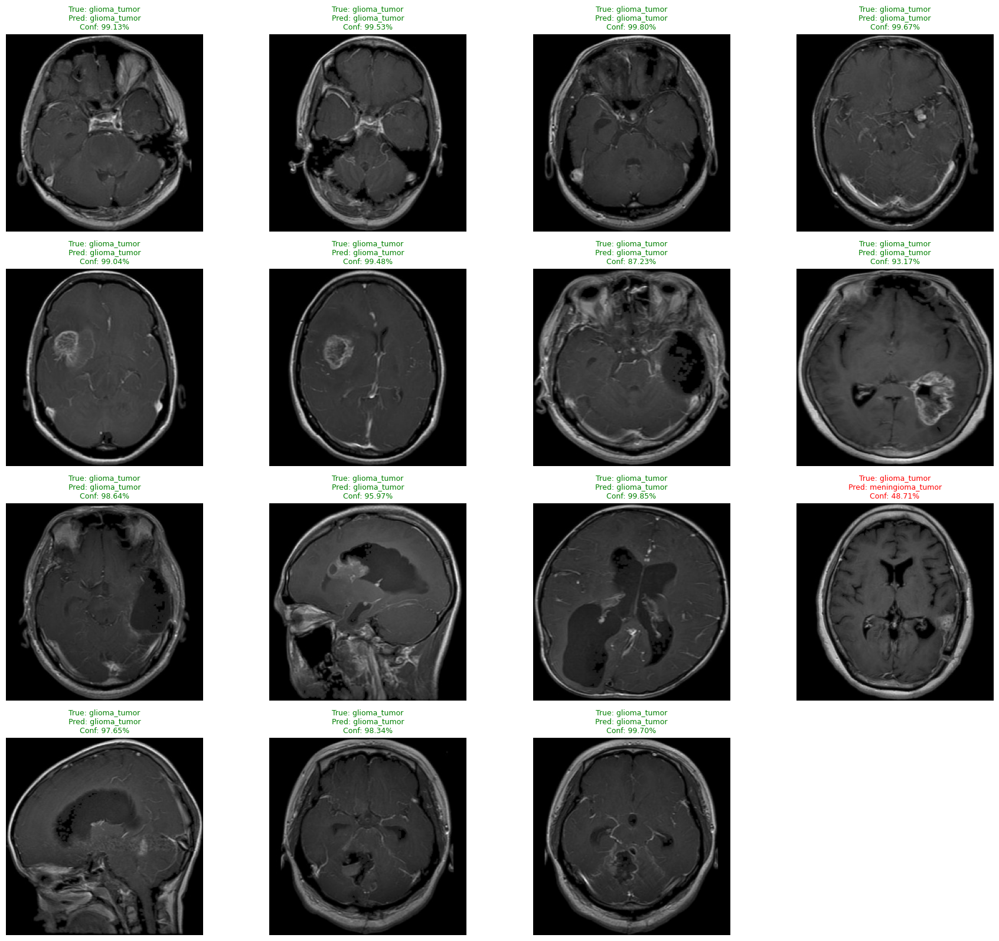

In [47]:
# Display sample predictions from test dataset
test_images, test_labels = next(test_generator)

predictions = baseline_model.predict(test_images)

plt.figure(figsize=(18, 20))

for i in range(15):

    plt.subplot(5, 4, i + 1)

    plt.imshow(test_images[i])

    true_index = np.argmax(test_labels[i])
    pred_index = np.argmax(predictions[i])

    true_label = class_names[true_index]
    predicted_label = class_names[pred_index]

    confidence = predictions[i][pred_index] * 100

    title_color = (
        "green"
        if true_index == pred_index
        else "red"
    )

    plt.title(
        f"True: {true_label}\n"
        f"Pred: {predicted_label}\n"
        f"Conf: {confidence:.2f}%",
        color=title_color,
        fontsize=9
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

In [48]:
# Save final baseline CNN model
baseline_model.save("baseline_cnn_final_model.keras")

print("Baseline CNN model saved successfully.")

Baseline CNN model saved successfully.


In [49]:
# Save training history for later comparison
baseline_history_df = pd.DataFrame(baseline_history.history)

baseline_history_df.to_csv(
    "baseline_cnn_training_history.csv",
    index=False
)

print("Baseline training history saved successfully.")

Baseline training history saved successfully.


In [51]:
# Import layers for deeper CNN architecture
from tensorflow.keras.layers import (
    BatchNormalization,
    Dropout
)

In [52]:
# Better deeper architecture for your dataset
deeper_model = Sequential([

    Conv2D(32, (3, 3), activation="relu", padding="same", input_shape=input_shape),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(64, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(128, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(256, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(256, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(256, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),

    Dense(256, activation="relu"),
    Dropout(0.5),

    Dense(128, activation="relu"),
    Dropout(0.3),

    Dense(64, activation="relu"),

    Dense(num_classes, activation="softmax")
])

deeper_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)               │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256, 256, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 128, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 32, 32, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 32, 32, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 16, 16, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 8, 8, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │     1,048,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 128)            │        32,89

 Total params: 2,662,788 (10.16 MB)

 Trainable params: 2,660,804 (10.15 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [53]:
# Compile deeper CNN model
deeper_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print("Deeper CNN model compiled successfully.")

Deeper CNN model compiled successfully.


In [54]:
# Define callbacks for deeper CNN model
deeper_checkpoint = ModelCheckpoint(
    "deeper_best_model.keras",
    monitor="val_accuracy",
    save_best_only=True,
    verbose=1
)

deeper_callbacks = [
    early_stopping,
    reduce_lr,
    deeper_checkpoint
]

In [55]:
# Train deeper CNN model and record training time
import time

start_time = time.time()

deeper_history = deeper_model.fit(
    train_generator,
    epochs=30,
    validation_data=validation_generator,
    class_weight=class_weight_dict,
    callbacks=deeper_callbacks
)

end_time = time.time()

deeper_training_time = end_time - start_time

print("Deeper CNN Training Time:", round(deeper_training_time, 2), "seconds")

Epoch 1/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 640ms/step - accuracy: 0.2818 - loss: 2.0963
Epoch 1: val_accuracy improved from None to 0.28947, saving model to deeper_best_model.keras

Epoch 1: finished saving model to deeper_best_model.keras
58/58 ━━━━━━━━━━━━━━━━━━━━ 60s 735ms/step - accuracy: 0.3112 - loss: 1.7628 - val_accuracy: 0.2895 - val_loss: 1.3921 - learning_rate: 0.0010
Epoch 2/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 518ms/step - accuracy: 0.3651 - loss: 1.3709
Epoch 2: val_accuracy improved from 0.28947 to 0.30263, saving model to deeper_best_model.keras

Epoch 2: finished saving model to deeper_best_model.keras
58/58 ━━━━━━━━━━━━━━━━━━━━ 31s 537ms/step - accuracy: 0.3695 - loss: 1.3513 - val_accuracy: 0.3026 - val_loss: 1.4419 - learning_rate: 0.0010
Epoch 3/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 521ms/step - accuracy: 0.4027 - loss: 1.2401
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 3: val_accuracy improved from 0.30263 to 0.43860, saving model to de

In [56]:
# Load the best saved deeper CNN model
deeper_model = tf.keras.models.load_model(
    "deeper_best_model.keras"
)

print("Best deeper CNN model loaded successfully.")

Best deeper CNN model loaded successfully.


In [57]:
# Display best validation results
best_epoch = np.argmax(
    deeper_history.history["val_accuracy"]
) + 1

best_val_accuracy = max(
    deeper_history.history["val_accuracy"]
)

best_val_loss = min(
    deeper_history.history["val_loss"]
)

print("Best Epoch:", best_epoch)

print(
    "Best Validation Accuracy:",
    round(best_val_accuracy, 4)
)

print(
    "Best Validation Loss:",
    round(best_val_loss, 4)
)

Best Epoch: 3
Best Validation Accuracy: 0.4386
Best Validation Loss: 1.2139


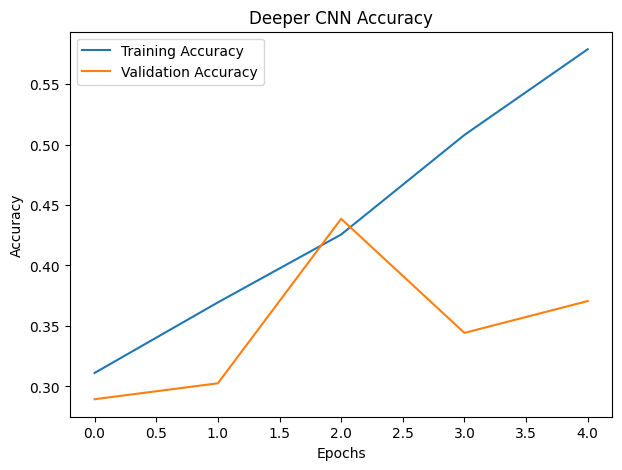

In [58]:
# Plot training and validation accuracy
plt.figure(figsize=(7, 5))

plt.plot(
    deeper_history.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    deeper_history.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Deeper CNN Accuracy")

plt.legend()
plt.show()

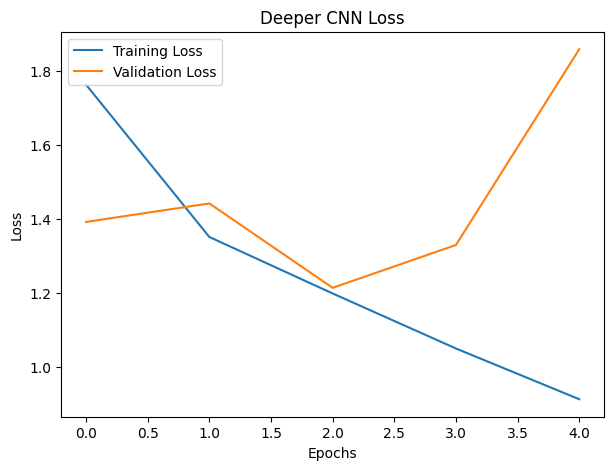

In [59]:
# Plot training and validation loss
plt.figure(figsize=(7, 5))

plt.plot(
    deeper_history.history["loss"],
    label="Training Loss"
)

plt.plot(
    deeper_history.history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Deeper CNN Loss")

plt.legend()
plt.show()

In [60]:
# Generate predictions on test dataset
y_pred_probabilities = deeper_model.predict(
    test_generator
)

y_pred = np.argmax(
    y_pred_probabilities,
    axis=1
)

y_true = test_generator.classes

class_names = list(
    test_generator.class_indices.keys()
)

17/17 ━━━━━━━━━━━━━━━━━━━━ 5s 247ms/step


In [61]:
# Display classification report
print(
    classification_report(
        y_true,
        y_pred,
        target_names=class_names
    )
)

                  precision    recall  f1-score   support

    glioma_tumor       0.59      0.29      0.39       177
meningioma_tumor       0.00      0.00      0.00       144
          normal       0.65      0.31      0.42        48
 pituitary_tumor       0.37      0.96      0.53       164

        accuracy                           0.42       533
       macro avg       0.40      0.39      0.34       533
    weighted avg       0.37      0.42      0.33       533



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


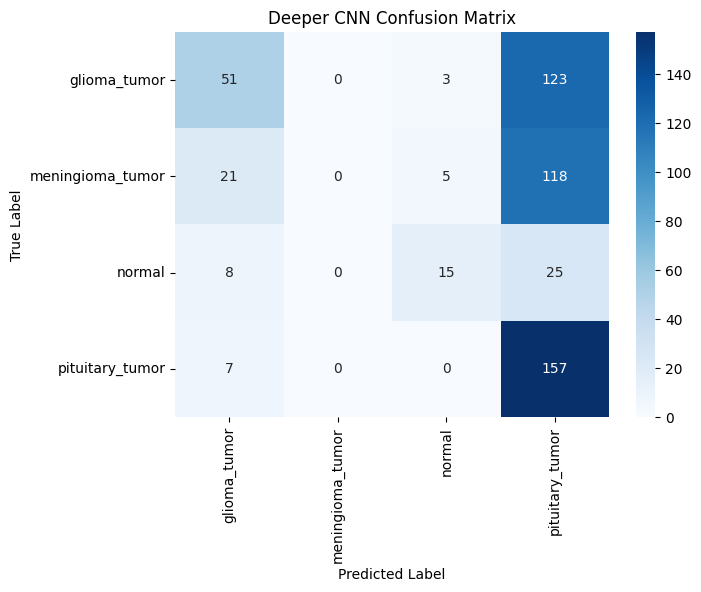

In [62]:
# Plot confusion matrix
conf_matrix = confusion_matrix(
    y_true,
    y_pred
)

plt.figure(figsize=(7, 5))

sns.heatmap(
    conf_matrix,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Deeper CNN Confusion Matrix")

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


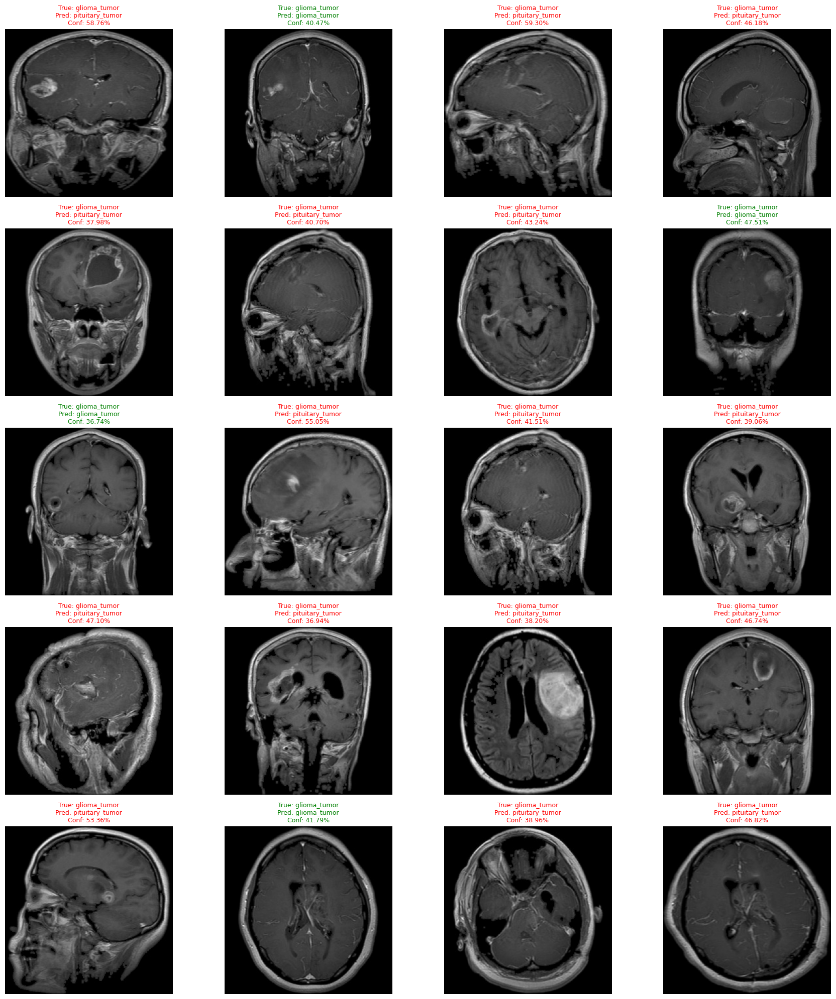

In [63]:
# Display sample predictions from deeper CNN model
test_images, test_labels = next(test_generator)

predictions = deeper_model.predict(test_images)

plt.figure(figsize=(18, 20))

for i in range(20):

    plt.subplot(5, 4, i + 1)

    plt.imshow(test_images[i])

    true_index = np.argmax(test_labels[i])
    pred_index = np.argmax(predictions[i])

    true_label = class_names[true_index]
    predicted_label = class_names[pred_index]

    confidence = predictions[i][pred_index] * 100

    title_color = (
        "green"
        if true_index == pred_index
        else "red"
    )

    plt.title(
        f"True: {true_label}\n"
        f"Pred: {predicted_label}\n"
        f"Conf: {confidence:.2f}%",
        color=title_color,
        fontsize=9
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

In [64]:
# Compare baseline and deeper CNN performance
baseline_best_accuracy = max(
    baseline_history.history["val_accuracy"]
)

baseline_best_loss = min(
    baseline_history.history["val_loss"]
)

deeper_best_accuracy = max(
    deeper_history.history["val_accuracy"]
)

deeper_best_loss = min(
    deeper_history.history["val_loss"]
)

comparison_df = pd.DataFrame({
    "Model": ["Baseline CNN", "Deeper CNN"],
    "Best Validation Accuracy": [
        baseline_best_accuracy,
        deeper_best_accuracy
    ],
    "Best Validation Loss": [
        baseline_best_loss,
        deeper_best_loss
    ]
})

comparison_df

,Model,Best Validation Accuracy,Best Validation Loss
0,Baseline CNN,0.787281,0.592077
1,Deeper CNN,0.438596,1.213922


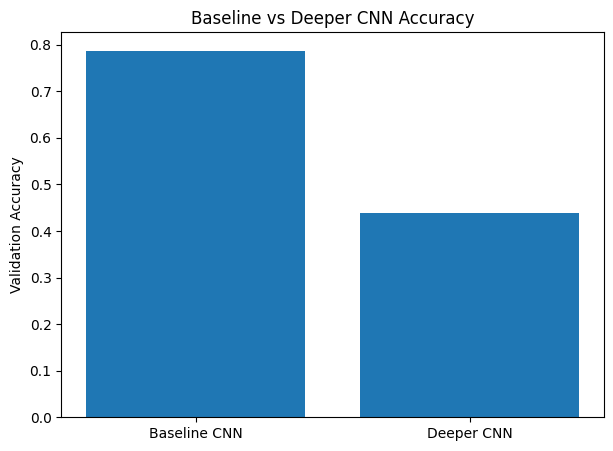

In [65]:
# Visualize model comparison
plt.figure(figsize=(7, 5))

plt.bar(
    comparison_df["Model"],
    comparison_df["Best Validation Accuracy"]
)

plt.ylabel("Validation Accuracy")
plt.title("Baseline vs Deeper CNN Accuracy")

plt.show()

In [66]:
# Import SGD optimizer
from tensorflow.keras.optimizers import SGD

In [67]:
# Build deeper CNN model with SGD optimizer
sgd_model = tf.keras.models.clone_model(deeper_model)

sgd_model.compile(
    optimizer=SGD(
        learning_rate=0.001,
        momentum=0.9
    ),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print("SGD model compiled successfully.")

SGD model compiled successfully.


In [68]:
# Train deeper CNN model using SGD optimizer
sgd_history = sgd_model.fit(
    train_generator,
    epochs=30,
    validation_data=validation_generator,
    class_weight=class_weight_dict,
    callbacks=callbacks
)

Epoch 1/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 602ms/step - accuracy: 0.3156 - loss: 1.7314
Epoch 1: val_accuracy did not improve from 0.78728
58/58 ━━━━━━━━━━━━━━━━━━━━ 46s 644ms/step - accuracy: 0.3417 - loss: 1.5319 - val_accuracy: 0.3311 - val_loss: 1.3235 - learning_rate: 0.0010
Epoch 2/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 517ms/step - accuracy: 0.4142 - loss: 1.2926
Epoch 2: val_accuracy did not improve from 0.78728
58/58 ━━━━━━━━━━━━━━━━━━━━ 31s 531ms/step - accuracy: 0.4076 - loss: 1.2703 - val_accuracy: 0.3596 - val_loss: 1.3185 - learning_rate: 0.0010
Epoch 3/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 543ms/step - accuracy: 0.4466 - loss: 1.2046
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 3: val_accuracy did not improve from 0.78728
58/58 ━━━━━━━━━━━━━━━━━━━━ 33s 562ms/step - accuracy: 0.4572 - loss: 1.1791 - val_accuracy: 0.3421 - val_loss: 1.3137 - learning_rate: 0.0010
Epoch 4/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 527ms/step - accuracy: 0.4916 - loss: 1.1280


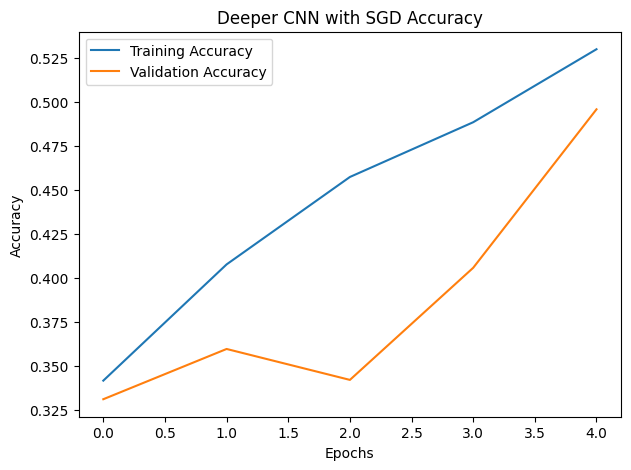

In [69]:
# Plot SGD training and validation accuracy
plt.figure(figsize=(7, 5))

plt.plot(
    sgd_history.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    sgd_history.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Deeper CNN with SGD Accuracy")

plt.legend()
plt.show()

In [71]:
# Display best SGD validation results
best_sgd_epoch = np.argmax(
    sgd_history.history["val_accuracy"]
) + 1

best_sgd_accuracy = max(
    sgd_history.history["val_accuracy"]
)

best_sgd_loss = min(
    sgd_history.history["val_loss"]
)

print("Best SGD Epoch:", best_sgd_epoch)

print(
    "Best SGD Validation Accuracy:",
    round(best_sgd_accuracy, 4)
)

print(
    "Best SGD Validation Loss:",
    round(best_sgd_loss, 4)
)

Best SGD Epoch: 5
Best SGD Validation Accuracy: 0.4956
Best SGD Validation Loss: 1.1856


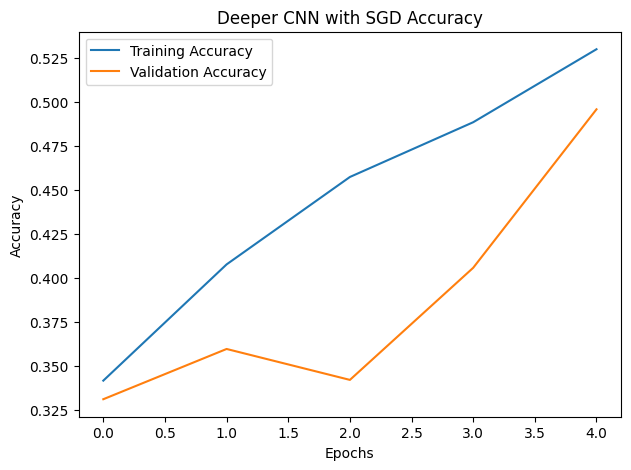

In [72]:
# Plot SGD training and validation accuracy
plt.figure(figsize=(7, 5))

plt.plot(
    sgd_history.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    sgd_history.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Deeper CNN with SGD Accuracy")

plt.legend()
plt.show()

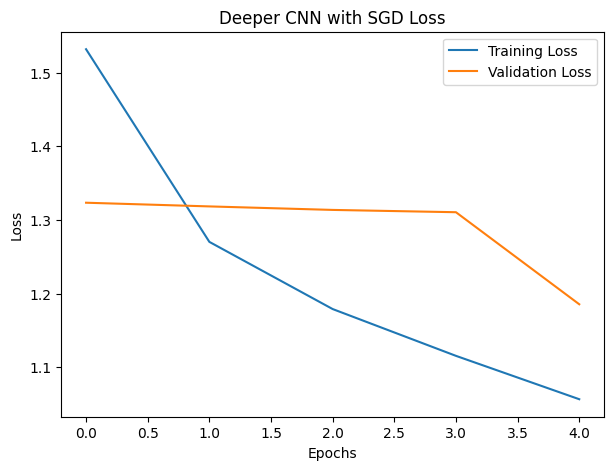

In [73]:
# Plot SGD training and validation loss
plt.figure(figsize=(7, 5))

plt.plot(
    sgd_history.history["loss"],
    label="Training Loss"
)

plt.plot(
    sgd_history.history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Deeper CNN with SGD Loss")

plt.legend()
plt.show()

In [74]:
# Generate predictions using SGD model
y_pred_probabilities = sgd_model.predict(
    test_generator
)

y_pred = np.argmax(
    y_pred_probabilities,
    axis=1
)

y_true = test_generator.classes

class_names = list(
    test_generator.class_indices.keys()
)

17/17 ━━━━━━━━━━━━━━━━━━━━ 5s 180ms/step


In [75]:
# Display SGD classification report
print(
    classification_report(
        y_true,
        y_pred,
        target_names=class_names
    )
)

                  precision    recall  f1-score   support

    glioma_tumor       0.34      0.98      0.50       177
meningioma_tumor       0.31      0.03      0.05       144
          normal       0.75      0.06      0.12        48
 pituitary_tumor       0.00      0.00      0.00       164

        accuracy                           0.34       533
       macro avg       0.35      0.27      0.17       533
    weighted avg       0.26      0.34      0.19       533



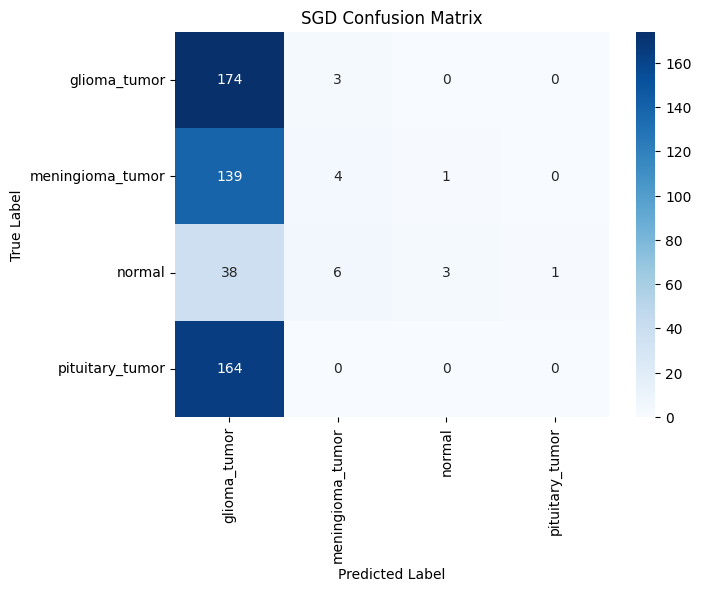

In [76]:
# Plot SGD confusion matrix
conf_matrix = confusion_matrix(
    y_true,
    y_pred
)

plt.figure(figsize=(7, 5))

sns.heatmap(
    conf_matrix,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("SGD Confusion Matrix")

plt.show()

In [77]:
# Compare Adam and SGD optimizer performance
optimizer_comparison_df = pd.DataFrame({
    "Optimizer": ["Adam", "SGD"],

    "Best Validation Accuracy": [
        max(deeper_history.history["val_accuracy"]),
        max(sgd_history.history["val_accuracy"])
    ],

    "Best Validation Loss": [
        min(deeper_history.history["val_loss"]),
        min(sgd_history.history["val_loss"])
    ]
})

optimizer_comparison_df

,Optimizer,Best Validation Accuracy,Best Validation Loss
0,Adam,0.438596,1.213922
1,SGD,0.495614,1.185602


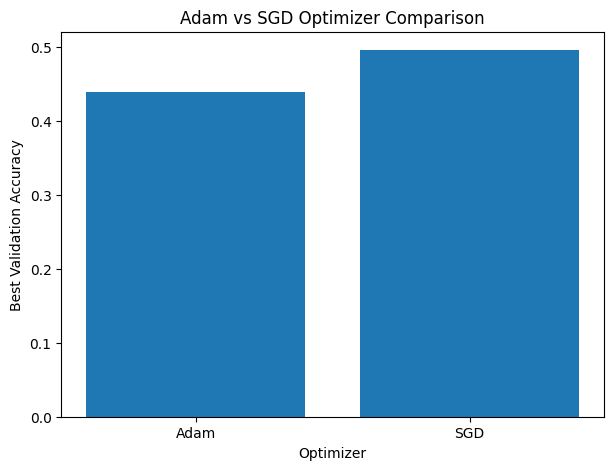

In [78]:
# Visualize Adam vs SGD comparison
plt.figure(figsize=(7, 5))

plt.bar(
    optimizer_comparison_df["Optimizer"],
    optimizer_comparison_df["Best Validation Accuracy"]
)

plt.xlabel("Optimizer")
plt.ylabel("Best Validation Accuracy")
plt.title("Adam vs SGD Optimizer Comparison")

plt.show()

In [80]:
# Import Input layer
from tensorflow.keras import Input

In [81]:
# Build deeper CNN model without dropout
ablation_model = Sequential([

    Input(shape=input_shape),

    Conv2D(32, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(64, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(128, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(256, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(256, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Conv2D(256, (3, 3), activation="relu", padding="same"),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2, 2)),

    Flatten(),

    Dense(256, activation="relu"),

    Dense(128, activation="relu"),

    Dense(64, activation="relu"),

    Dense(num_classes, activation="softmax")
])

ablation_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)              │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 256, 256, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_7           │ (None, 128, 128, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 64, 64, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_8           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 32, 32, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_9           │ (None, 32, 32, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 16, 16, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 8, 8, 256)      │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 4, 4, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 256)            │     1,048,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 64)             │         8,25

 Total params: 2,662,788 (10.16 MB)

 Trainable params: 2,660,804 (10.15 MB)

 Non-trainable params: 1,984 (7.75 KB)

In [82]:
# Compile ablation model
ablation_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print("Ablation model compiled successfully.")

Ablation model compiled successfully.


In [83]:
# Train ablation model without dropout
ablation_history = ablation_model.fit(
    train_generator,
    epochs=30,
    validation_data=validation_generator,
    class_weight=class_weight_dict,
    callbacks=callbacks
)

Epoch 1/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 621ms/step - accuracy: 0.4029 - loss: 1.7714
Epoch 1: val_accuracy did not improve from 0.78728
58/58 ━━━━━━━━━━━━━━━━━━━━ 49s 664ms/step - accuracy: 0.4730 - loss: 1.3523 - val_accuracy: 0.1118 - val_loss: 2.7044 - learning_rate: 0.0010
Epoch 2/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 515ms/step - accuracy: 0.6350 - loss: 0.9160
Epoch 2: val_accuracy did not improve from 0.78728
58/58 ━━━━━━━━━━━━━━━━━━━━ 31s 528ms/step - accuracy: 0.6507 - loss: 0.8519 - val_accuracy: 0.2895 - val_loss: 7.5581 - learning_rate: 0.0010
Epoch 3/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 540ms/step - accuracy: 0.6845 - loss: 0.7295
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.

Epoch 3: val_accuracy did not improve from 0.78728
58/58 ━━━━━━━━━━━━━━━━━━━━ 32s 558ms/step - accuracy: 0.7003 - loss: 0.6995 - val_accuracy: 0.2895 - val_loss: 7.7319 - learning_rate: 0.0010
Epoch 4/30
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 514ms/step - accuracy: 0.7448 - loss: 0.5783


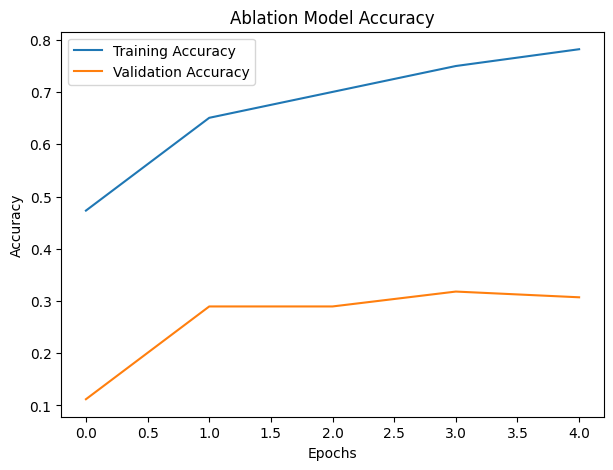

In [84]:
# Plot ablation model accuracy
plt.figure(figsize=(7, 5))

plt.plot(
    ablation_history.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    ablation_history.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Ablation Model Accuracy")

plt.legend()
plt.show()

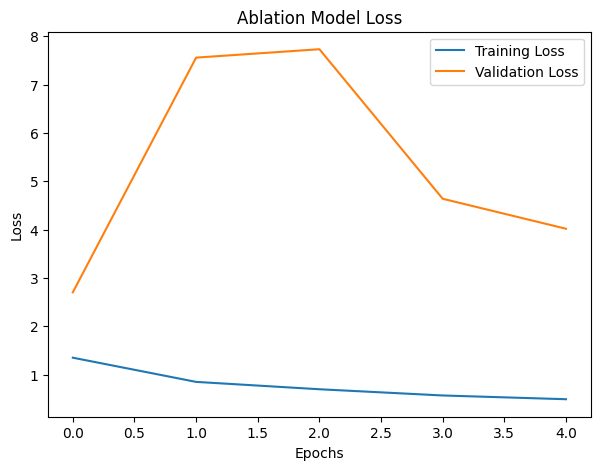

In [85]:
# Plot ablation model loss
plt.figure(figsize=(7, 5))

plt.plot(
    ablation_history.history["loss"],
    label="Training Loss"
)

plt.plot(
    ablation_history.history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Ablation Model Loss")

plt.legend()
plt.show()

In [86]:
# Compare deeper CNN and ablation model
ablation_comparison_df = pd.DataFrame({
    "Model": [
        "With Dropout",
        "Without Dropout"
    ],

    "Best Validation Accuracy": [
        max(deeper_history.history["val_accuracy"]),
        max(ablation_history.history["val_accuracy"])
    ],

    "Best Validation Loss": [
        min(deeper_history.history["val_loss"]),
        min(ablation_history.history["val_loss"])
    ]
})

ablation_comparison_df

,Model,Best Validation Accuracy,Best Validation Loss
0,With Dropout,0.438596,1.213922
1,Without Dropout,0.317982,2.704409


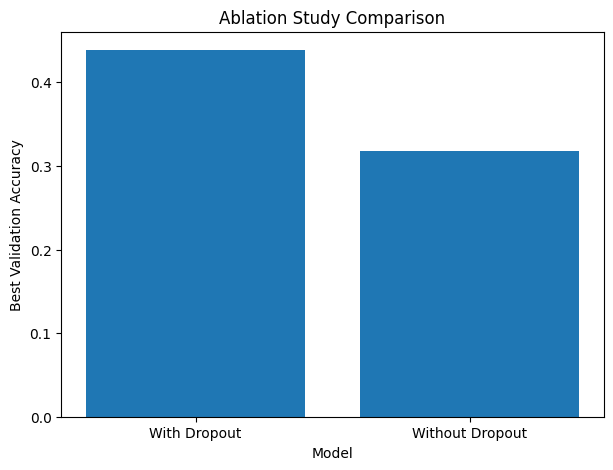

In [87]:
# Visualize ablation study comparison
plt.figure(figsize=(7, 5))

plt.bar(
    ablation_comparison_df["Model"],
    ablation_comparison_df["Best Validation Accuracy"]
)

plt.xlabel("Model")
plt.ylabel("Best Validation Accuracy")
plt.title("Ablation Study Comparison")

plt.show()

In [88]:
# Create final model comparison table
final_comparison_df = pd.DataFrame({

    "Model": [
        "Baseline CNN",
        "Deeper CNN (Adam)",
        "Deeper CNN (SGD)",
        "Deeper CNN Without Dropout"
    ],

    "Best Validation Accuracy": [
        max(baseline_history.history["val_accuracy"]),
        max(deeper_history.history["val_accuracy"]),
        max(sgd_history.history["val_accuracy"]),
        max(ablation_history.history["val_accuracy"])
    ],

    "Best Validation Loss": [
        min(baseline_history.history["val_loss"]),
        min(deeper_history.history["val_loss"]),
        min(sgd_history.history["val_loss"]),
        min(ablation_history.history["val_loss"])
    ]
})

final_comparison_df

,Model,Best Validation Accuracy,Best Validation Loss
0,Baseline CNN,0.787281,0.592077
1,Deeper CNN (Adam),0.438596,1.213922
2,Deeper CNN (SGD),0.495614,1.185602
3,Deeper CNN Without Dropout,0.317982,2.704409


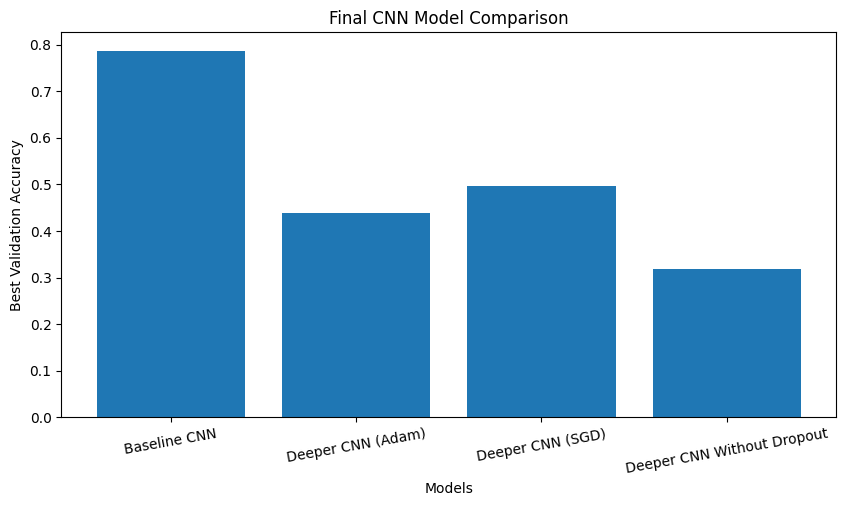

In [89]:
# Visualize final model comparison
plt.figure(figsize=(10, 5))

plt.bar(
    final_comparison_df["Model"],
    final_comparison_df["Best Validation Accuracy"]
)

plt.xticks(rotation=10)

plt.xlabel("Models")
plt.ylabel("Best Validation Accuracy")
plt.title("Final CNN Model Comparison")

plt.show()

In [91]:
final_comparison_df.to_csv(
    "/content/drive/MyDrive/final_model_comparison.csv",
    index=False
)

In [92]:
# Import libraries for transfer learning using ResNet50
from tensorflow.keras.applications import ResNet50

from tensorflow.keras.applications.resnet50 import (
    preprocess_input
)

from tensorflow.keras.models import Model

from tensorflow.keras.layers import (
    Input,
    Dense,
    Dropout,
    GlobalAveragePooling2D
)

In [93]:
# Configure image preprocessing for ResNet50
image_size = 224
batch_size = 32

train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=20,
    width_shift_range=0.10,
    height_shift_range=0.10,
    zoom_range=0.10,
    horizontal_flip=True,
    validation_split=0.20
)

validation_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    validation_split=0.20
)

test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

In [94]:
# Create training, validation, and testing generators for ResNet50
resnet_train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode="categorical",
    subset="training",
    shuffle=True
)

resnet_validation_generator = validation_datagen.flow_from_directory(
    train_path,
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode="categorical",
    subset="validation",
    shuffle=False
)

resnet_test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size=(image_size, image_size),
    batch_size=batch_size,
    class_mode="categorical",
    shuffle=False
)

print("Training Samples:", resnet_train_generator.samples)
print("Validation Samples:", resnet_validation_generator.samples)
print("Testing Samples:", resnet_test_generator.samples)

print("\nClass Indices:")
print(resnet_train_generator.class_indices)

Found 1835 images belonging to 4 classes.
Found 456 images belonging to 4 classes.
Found 533 images belonging to 4 classes.
Training Samples: 1835
Validation Samples: 456
Testing Samples: 533

Class Indices:
{'glioma_tumor': 0, 'meningioma_tumor': 1, 'normal': 2, 'pituitary_tumor': 3}


In [95]:
# Calculate class weights for ResNet50 training
resnet_class_weights = compute_class_weight(
    class_weight="balanced",
    classes=np.unique(resnet_train_generator.classes),
    y=resnet_train_generator.classes
)

resnet_class_weight_dict = dict(enumerate(resnet_class_weights))

print("ResNet50 Class Weights:")
print(resnet_class_weight_dict)

ResNet50 Class Weights:
{0: np.float64(0.8177361853832442), 1: np.float64(0.8574766355140186), 2: np.float64(2.2055288461538463), 3: np.float64(0.8639359698681732)}


In [96]:
# Load ResNet50 base model with ImageNet weights
base_model = ResNet50(
    weights="imagenet",
    include_top=False,
    input_shape=(image_size, image_size, 3)
)

# Freeze convolutional base for feature extraction
base_model.trainable = False

print("ResNet50 base model loaded successfully.")

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
ResNet50 base model loaded successfully.


In [97]:
# Build custom classification head for ResNet50
x = base_model.output

x = GlobalAveragePooling2D()(x)

x = Dense(128, activation="relu")(x)

x = Dropout(0.4)(x)

output_layer = Dense(
    num_classes,
    activation="softmax"
)(x)

# Create final transfer learning model
resnet_model = Model(
    inputs=base_model.input,
    outputs=output_layer
)

resnet_model.summary()

Model: "functional_40"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_3[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,850,500 (90.98 MB)

 Trainable params: 262,788 (1.00 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [98]:
# Compile ResNet50 feature extraction model
resnet_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print("ResNet50 feature extraction model compiled successfully.")

ResNet50 feature extraction model compiled successfully.


In [99]:
# Define callbacks for ResNet50 feature extraction
resnet_checkpoint = ModelCheckpoint(
    "resnet_feature_extraction_best_model.keras",
    monitor="val_accuracy",
    save_best_only=True,
    verbose=1
)

resnet_callbacks = [
    early_stopping,
    reduce_lr,
    resnet_checkpoint
]

In [100]:
# Train ResNet50 feature extraction model
resnet_history = resnet_model.fit(
    resnet_train_generator,
    epochs=20,
    validation_data=resnet_validation_generator,
    class_weight=resnet_class_weight_dict,
    callbacks=resnet_callbacks
)

Epoch 1/20
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 506ms/step - accuracy: 0.4914 - loss: 1.3091
Epoch 1: val_accuracy improved from None to 0.74561, saving model to resnet_feature_extraction_best_model.keras

Epoch 1: finished saving model to resnet_feature_extraction_best_model.keras
58/58 ━━━━━━━━━━━━━━━━━━━━ 55s 702ms/step - accuracy: 0.5940 - loss: 0.9967 - val_accuracy: 0.7456 - val_loss: 0.6499 - learning_rate: 0.0010
Epoch 2/20
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 432ms/step - accuracy: 0.7357 - loss: 0.6471
Epoch 2: val_accuracy improved from 0.74561 to 0.75877, saving model to resnet_feature_extraction_best_model.keras

Epoch 2: finished saving model to resnet_feature_extraction_best_model.keras
58/58 ━━━━━━━━━━━━━━━━━━━━ 27s 470ms/step - accuracy: 0.7411 - loss: 0.6269 - val_accuracy: 0.7588 - val_loss: 0.6259 - learning_rate: 0.0010
Epoch 3/20
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step - accuracy: 0.7827 - loss: 0.5319
Epoch 3: val_accuracy improved from 0.75877 to 0.80482, saving model to res

In [101]:
# Load best ResNet50 feature extraction model
resnet_model = tf.keras.models.load_model(
    "resnet_feature_extraction_best_model.keras"
)

print("Best ResNet50 model loaded successfully.")

Best ResNet50 model loaded successfully.


In [102]:
# Display best validation results
best_epoch = np.argmax(
    resnet_history.history["val_accuracy"]
) + 1

best_val_accuracy = max(
    resnet_history.history["val_accuracy"]
)

best_val_loss = min(
    resnet_history.history["val_loss"]
)

print("Best Epoch:", best_epoch)

print(
    "Best Validation Accuracy:",
    round(best_val_accuracy, 4)
)

print(
    "Best Validation Loss:",
    round(best_val_loss, 4)
)

Best Epoch: 15
Best Validation Accuracy: 0.8465
Best Validation Loss: 0.3723


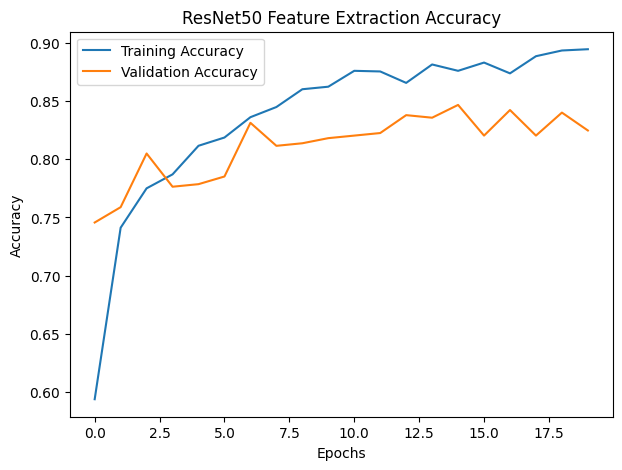

In [103]:
# Plot ResNet50 training and validation accuracy
plt.figure(figsize=(7, 5))

plt.plot(
    resnet_history.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    resnet_history.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("ResNet50 Feature Extraction Accuracy")

plt.legend()
plt.show()

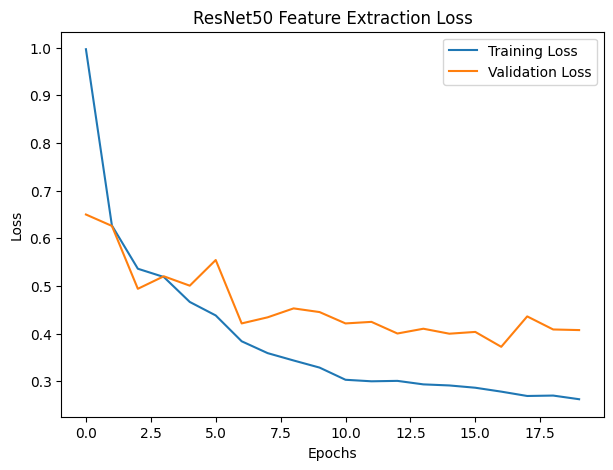

In [104]:
# Plot ResNet50 training and validation loss
plt.figure(figsize=(7, 5))

plt.plot(
    resnet_history.history["loss"],
    label="Training Loss"
)

plt.plot(
    resnet_history.history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("ResNet50 Feature Extraction Loss")

plt.legend()
plt.show()

In [105]:
# Generate predictions using ResNet50 feature extraction model
y_pred_probabilities = resnet_model.predict(
    resnet_test_generator
)

y_pred = np.argmax(
    y_pred_probabilities,
    axis=1
)

y_true = resnet_test_generator.classes

class_names = list(
    resnet_test_generator.class_indices.keys()
)

17/17 ━━━━━━━━━━━━━━━━━━━━ 13s 502ms/step


In [106]:
# Display classification report
print(
    classification_report(
        y_true,
        y_pred,
        target_names=class_names
    )
)

                  precision    recall  f1-score   support

    glioma_tumor       0.92      0.82      0.87       177
meningioma_tumor       0.81      0.82      0.81       144
          normal       0.85      0.96      0.90        48
 pituitary_tumor       0.92      0.98      0.95       164

        accuracy                           0.88       533
       macro avg       0.88      0.90      0.88       533
    weighted avg       0.89      0.88      0.88       533



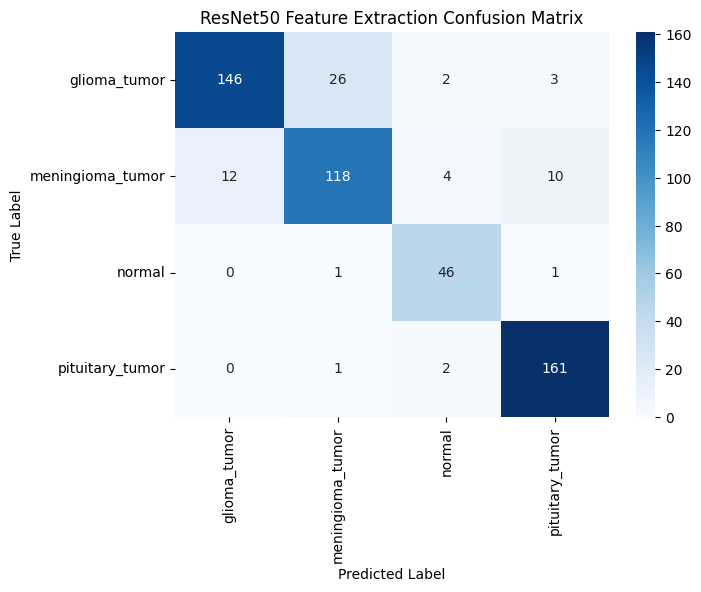

In [107]:
# Plot ResNet50 confusion matrix
conf_matrix = confusion_matrix(
    y_true,
    y_pred
)

plt.figure(figsize=(7, 5))

sns.heatmap(
    conf_matrix,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("ResNet50 Feature Extraction Confusion Matrix")

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step


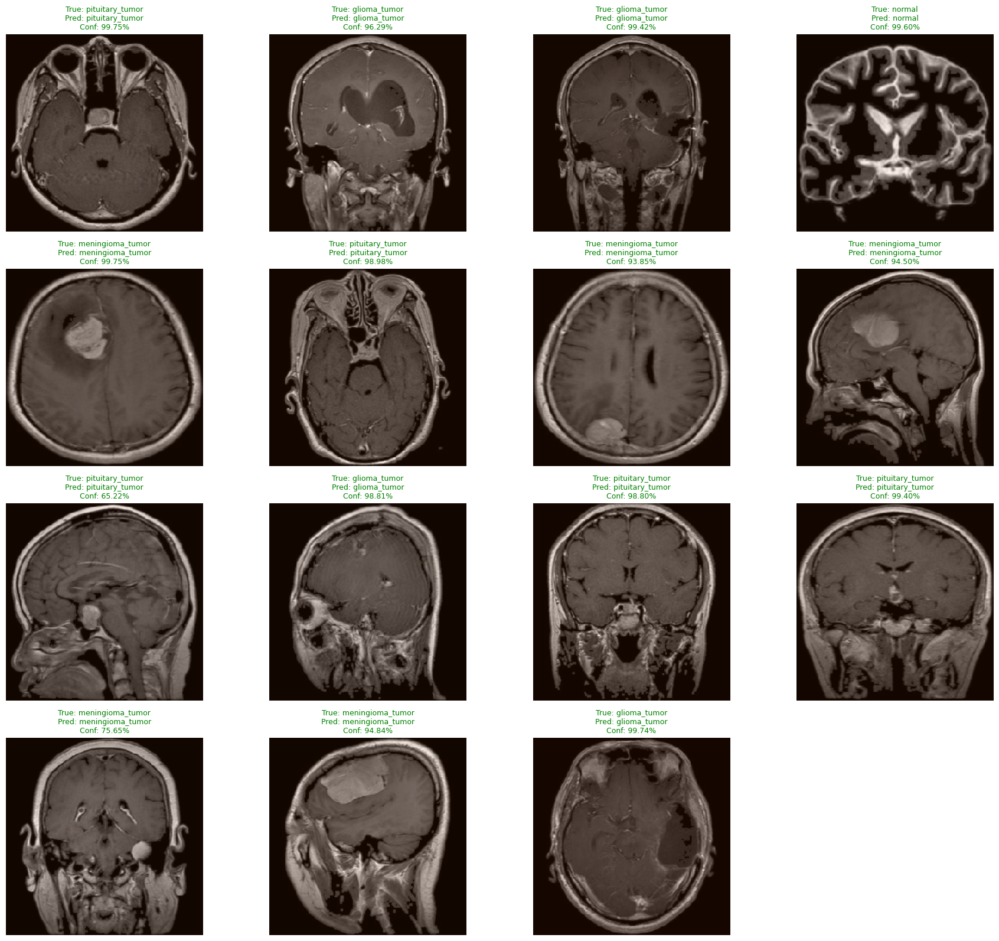

In [112]:
# Display random sample predictions from test dataset
resnet_test_generator.reset()

all_images = []
all_labels = []

for images, labels in resnet_test_generator:
    all_images.append(images)
    all_labels.append(labels)

    if len(all_images) * batch_size >= resnet_test_generator.samples:
        break

all_images = np.vstack(all_images)
all_labels = np.vstack(all_labels)

random_indices = np.random.choice(
    len(all_images),
    size=20,
    replace=False
)

sample_images = all_images[random_indices]
sample_labels = all_labels[random_indices]

predictions = resnet_model.predict(sample_images)

plt.figure(figsize=(18, 20))

for i in range(15):

    plt.subplot(5, 4, i + 1)

    image = sample_images[i]
    image = (image - image.min()) / (image.max() - image.min())

    plt.imshow(image)

    true_index = np.argmax(sample_labels[i])
    pred_index = np.argmax(predictions[i])

    true_label = class_names[true_index]
    predicted_label = class_names[pred_index]
    confidence = predictions[i][pred_index] * 100

    title_color = "green" if true_index == pred_index else "red"

    plt.title(
        f"True: {true_label}\nPred: {predicted_label}\nConf: {confidence:.2f}%",
        color=title_color,
        fontsize=9
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

In [113]:
# Unfreeze last layers of ResNet50 for fine-tuning
base_model.trainable = True

for layer in base_model.layers[:-30]:
    layer.trainable = False

print("Fine-tuning enabled for last ResNet50 layers.")

Fine-tuning enabled for last ResNet50 layers.


In [114]:
# Compile ResNet50 model for fine-tuning
resnet_model.compile(
    optimizer=Adam(learning_rate=0.00001),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

print("ResNet50 fine-tuning model compiled successfully.")

ResNet50 fine-tuning model compiled successfully.


In [115]:
# Define checkpoint for fine-tuning phase
fine_tune_checkpoint = ModelCheckpoint(
    "resnet_finetune_best_model.keras",
    monitor="val_accuracy",
    save_best_only=True,
    verbose=1
)

fine_tune_callbacks = [
    early_stopping,
    reduce_lr,
    fine_tune_checkpoint
]

In [116]:
# Train ResNet50 fine-tuning model
fine_tune_history = resnet_model.fit(
    resnet_train_generator,
    epochs=15,
    validation_data=resnet_validation_generator,
    class_weight=resnet_class_weight_dict,
    callbacks=fine_tune_callbacks
)

Epoch 1/15
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step - accuracy: 0.8930 - loss: 0.2772
Epoch 1: val_accuracy improved from None to 0.83772, saving model to resnet_finetune_best_model.keras

Epoch 1: finished saving model to resnet_finetune_best_model.keras
58/58 ━━━━━━━━━━━━━━━━━━━━ 50s 623ms/step - accuracy: 0.8850 - loss: 0.2824 - val_accuracy: 0.8377 - val_loss: 0.4080 - learning_rate: 1.0000e-05
Epoch 2/15
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 399ms/step - accuracy: 0.8684 - loss: 0.3060
Epoch 2: val_accuracy did not improve from 0.83772
58/58 ━━━━━━━━━━━━━━━━━━━━ 25s 425ms/step - accuracy: 0.8828 - loss: 0.2810 - val_accuracy: 0.8377 - val_loss: 0.4120 - learning_rate: 1.0000e-05
Epoch 3/15
58/58 ━━━━━━━━━━━━━━━━━━━━ 0s 391ms/step - accuracy: 0.8853 - loss: 0.2774
Epoch 3: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-06.

Epoch 3: val_accuracy did not improve from 0.83772
58/58 ━━━━━━━━━━━━━━━━━━━━ 24s 414ms/step - accuracy: 0.8828 - loss: 0.2778 - val_accuracy: 0.8333 - 

In [117]:
# Load best fine-tuned ResNet50 model
resnet_model = tf.keras.models.load_model(
    "resnet_finetune_best_model.keras"
)

print("Best fine-tuned ResNet50 model loaded successfully.")

Best fine-tuned ResNet50 model loaded successfully.


In [118]:
# Display best fine-tuning validation results
best_epoch = np.argmax(
    fine_tune_history.history["val_accuracy"]
) + 1

best_val_accuracy = max(
    fine_tune_history.history["val_accuracy"]
)

best_val_loss = min(
    fine_tune_history.history["val_loss"]
)

print("Best Epoch:", best_epoch)

print(
    "Best Validation Accuracy:",
    round(best_val_accuracy, 4)
)

print(
    "Best Validation Loss:",
    round(best_val_loss, 4)
)

Best Epoch: 1
Best Validation Accuracy: 0.8377
Best Validation Loss: 0.408


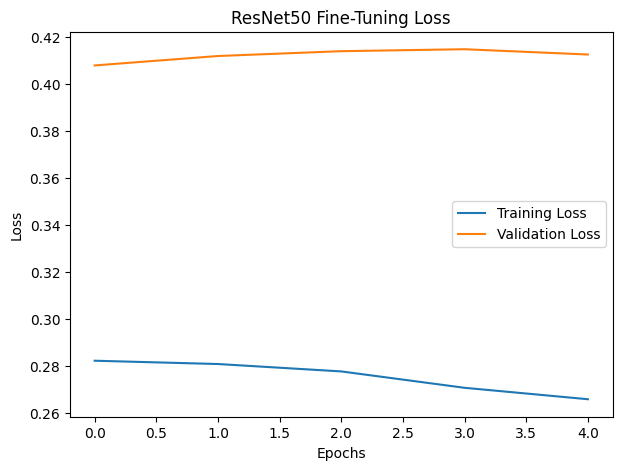

In [122]:
# Plot fine-tuning training and validation loss
plt.figure(figsize=(7, 5))

plt.plot(
    fine_tune_history.history["loss"],
    label="Training Loss"
)

plt.plot(
    fine_tune_history.history["val_loss"],
    label="Validation Loss"
)

plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("ResNet50 Fine-Tuning Loss")

plt.legend()
plt.show()

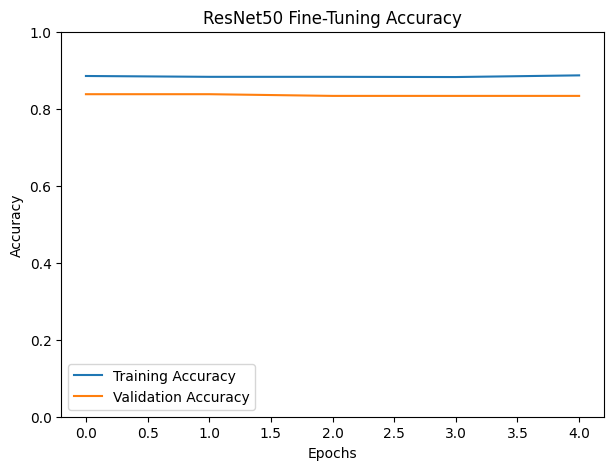

In [121]:
# Plot fine-tuning training and validation accuracy
plt.figure(figsize=(7, 5))

plt.plot(
    fine_tune_history.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    fine_tune_history.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("ResNet50 Fine-Tuning Accuracy")

plt.ylim(0, 1)

plt.legend()
plt.show()

In [123]:
# Generate predictions using fine-tuned ResNet50 model
y_pred_probabilities = resnet_model.predict(
    resnet_test_generator
)

y_pred = np.argmax(
    y_pred_probabilities,
    axis=1
)

y_true = resnet_test_generator.classes

class_names = list(
    resnet_test_generator.class_indices.keys()
)

17/17 ━━━━━━━━━━━━━━━━━━━━ 14s 392ms/step


In [124]:
# Display classification report
print(
    classification_report(
        y_true,
        y_pred,
        target_names=class_names
    )
)

                  precision    recall  f1-score   support

    glioma_tumor       0.93      0.85      0.89       177
meningioma_tumor       0.84      0.81      0.82       144
          normal       0.85      0.96      0.90        48
 pituitary_tumor       0.91      0.98      0.95       164

        accuracy                           0.89       533
       macro avg       0.88      0.90      0.89       533
    weighted avg       0.89      0.89      0.89       533



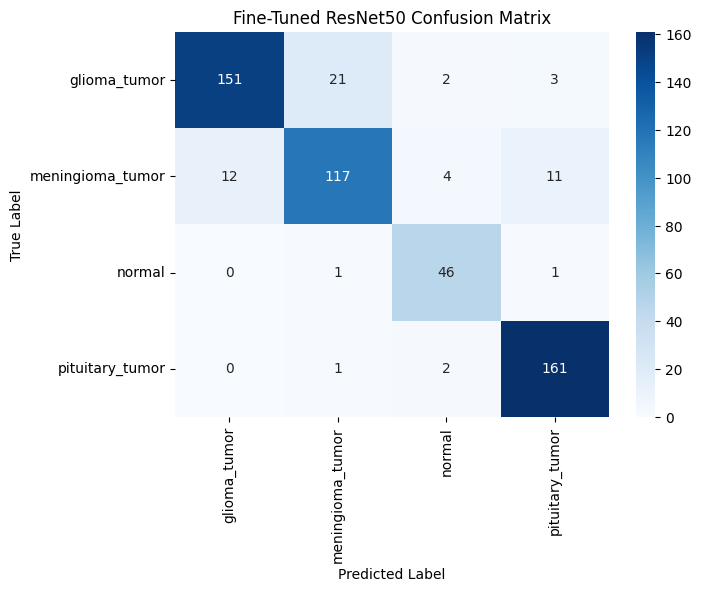

In [125]:
# Plot fine-tuned ResNet50 confusion matrix
conf_matrix = confusion_matrix(
    y_true,
    y_pred
)

plt.figure(figsize=(7, 5))

sns.heatmap(
    conf_matrix,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Fine-Tuned ResNet50 Confusion Matrix")

plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step


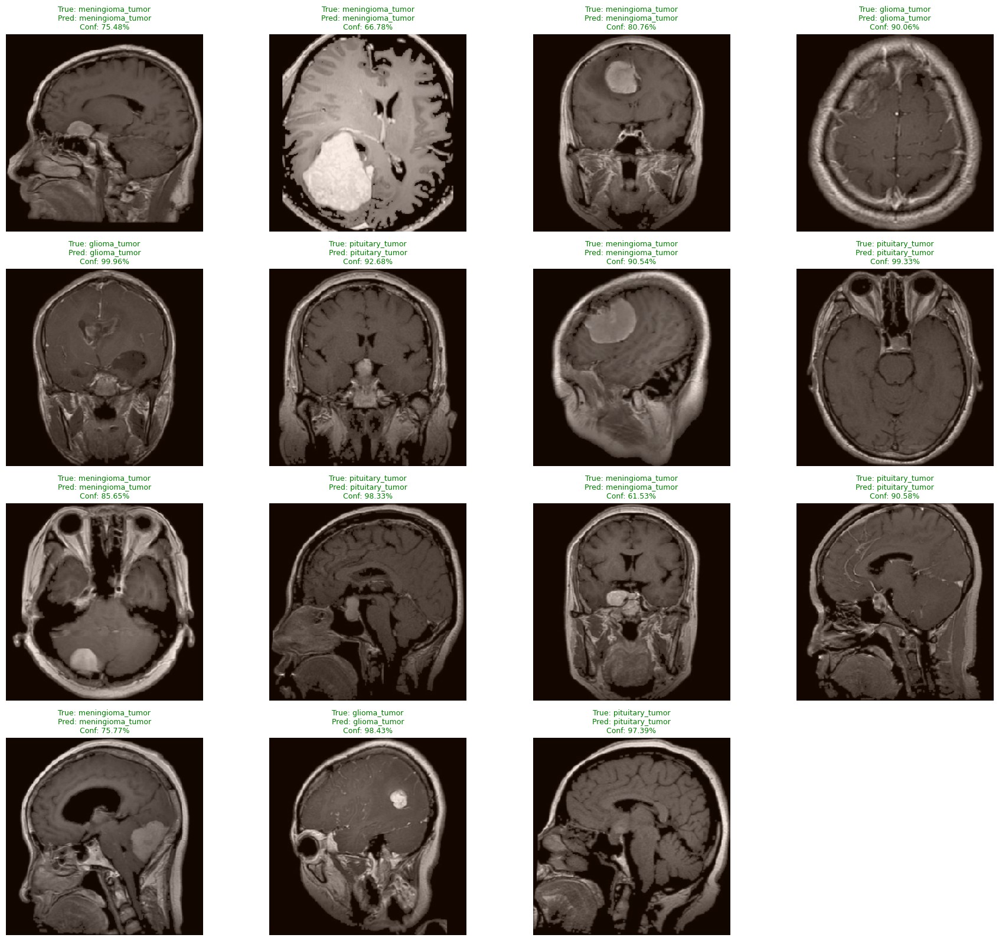

In [127]:
# Display sample predictions from fine-tuned ResNet50 model
resnet_test_generator.reset()

all_images = []
all_labels = []

for images, labels in resnet_test_generator:

    all_images.append(images)
    all_labels.append(labels)

    if len(all_images) * batch_size >= resnet_test_generator.samples:
        break

all_images = np.vstack(all_images)
all_labels = np.vstack(all_labels)

random_indices = np.random.choice(
    len(all_images),
    size=20,
    replace=False
)

sample_images = all_images[random_indices]
sample_labels = all_labels[random_indices]

predictions = resnet_model.predict(sample_images)

plt.figure(figsize=(18, 20))

for i in range(15):

    plt.subplot(5, 4, i + 1)

    image = sample_images[i]

    image = (image - image.min()) / (
        image.max() - image.min()
    )

    plt.imshow(image)

    true_index = np.argmax(sample_labels[i])
    pred_index = np.argmax(predictions[i])

    true_label = class_names[true_index]
    predicted_label = class_names[pred_index]

    confidence = predictions[i][pred_index] * 100

    title_color = (
        "green"
        if true_index == pred_index
        else "red"
    )

    plt.title(
        f"True: {true_label}\n"
        f"Pred: {predicted_label}\n"
        f"Conf: {confidence:.2f}%",
        color=title_color,
        fontsize=9
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

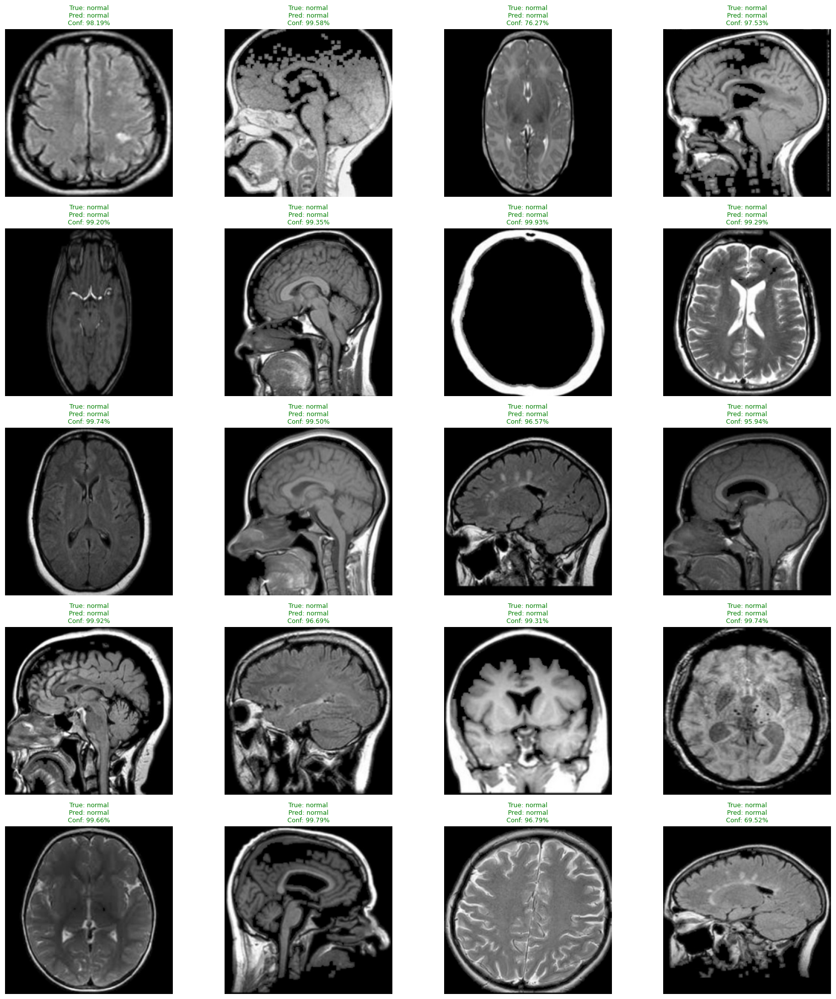

In [128]:
# Display sample predictions only for normal class
normal_class_path = os.path.join(
    test_path,
    "normal"
)

normal_images = os.listdir(normal_class_path)

selected_images = random.sample(
    normal_images,
    20
)

plt.figure(figsize=(18, 20))

for i, image_file in enumerate(selected_images):

    image_path = os.path.join(
        normal_class_path,
        image_file
    )

    image = Image.open(image_path).convert("RGB")

    image = image.resize(
        (image_size, image_size)
    )

    image_array = np.array(image)

    processed_image = preprocess_input(
        image_array.astype(np.float32)
    )

    processed_image = np.expand_dims(
        processed_image,
        axis=0
    )

    prediction = resnet_model.predict(
        processed_image,
        verbose=0
    )

    pred_index = np.argmax(prediction)

    predicted_label = class_names[pred_index]

    confidence = prediction[0][pred_index] * 100

    title_color = (
        "green"
        if predicted_label == "normal"
        else "red"
    )

    normalized_image = (
        image_array - image_array.min()
    ) / (
        image_array.max() - image_array.min()
    )

    plt.subplot(5, 4, i + 1)

    plt.imshow(normalized_image)

    plt.title(
        f"True: normal\n"
        f"Pred: {predicted_label}\n"
        f"Conf: {confidence:.2f}%",
        color=title_color,
        fontsize=9
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

In [129]:
# Compare all CNN and transfer learning models
final_transfer_comparison_df = pd.DataFrame({

    "Model": [
        "Baseline CNN",
        "Deeper CNN (Adam)",
        "Deeper CNN (SGD)",
        "Deeper CNN Without Dropout",
        "ResNet50 Feature Extraction",
        "ResNet50 Fine-Tuning"
    ],

    "Best Validation Accuracy": [
        max(baseline_history.history["val_accuracy"]),
        max(deeper_history.history["val_accuracy"]),
        max(sgd_history.history["val_accuracy"]),
        max(ablation_history.history["val_accuracy"]),
        max(resnet_history.history["val_accuracy"]),
        max(fine_tune_history.history["val_accuracy"])
    ],

    "Best Validation Loss": [
        min(baseline_history.history["val_loss"]),
        min(deeper_history.history["val_loss"]),
        min(sgd_history.history["val_loss"]),
        min(ablation_history.history["val_loss"]),
        min(resnet_history.history["val_loss"]),
        min(fine_tune_history.history["val_loss"])
    ]
})

final_transfer_comparison_df

,Model,Best Validation Accuracy,Best Validation Loss
0,Baseline CNN,0.787281,0.592077
1,Deeper CNN (Adam),0.438596,1.213922
2,Deeper CNN (SGD),0.495614,1.185602
3,Deeper CNN Without Dropout,0.317982,2.704409
4,ResNet50 Feature Extraction,0.846491,0.372284
5,ResNet50 Fine-Tuning,0.837719,0.407997


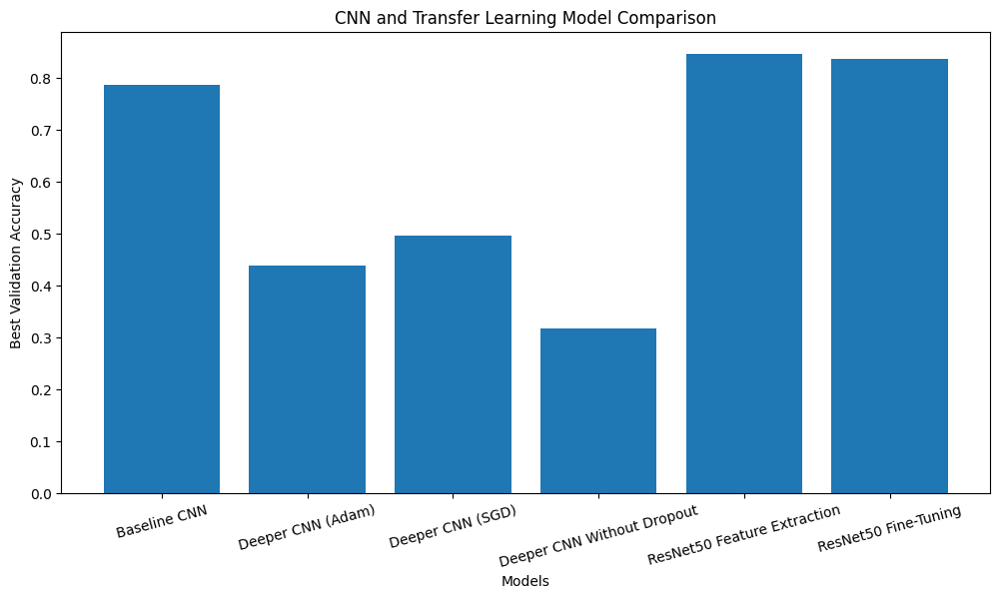

In [130]:
# Visualize final model comparison
plt.figure(figsize=(12, 6))

plt.bar(
    final_transfer_comparison_df["Model"],
    final_transfer_comparison_df["Best Validation Accuracy"]
)

plt.xticks(rotation=15)

plt.xlabel("Models")
plt.ylabel("Best Validation Accuracy")
plt.title("CNN and Transfer Learning Model Comparison")

plt.show()

In [132]:
# Save final transfer learning comparison table to Google Drive
final_transfer_comparison_df.to_csv(
    "/content/drive/MyDrive/final_transfer_learning_comparison.csv",
    index=False
)

print("Final transfer learning comparison saved to Google Drive successfully.")

Final transfer learning comparison saved to Google Drive successfully.


In [134]:
# Compare training and validation accuracy of all approaches
accuracy_comparison_df = pd.DataFrame({

    "Model": [
        "Baseline CNN",
        "Deeper CNN (Adam)",
        "Deeper CNN (SGD)",
        "Deeper CNN Without Dropout",
        "ResNet50 Feature Extraction",
        "ResNet50 Fine-Tuning"
    ],

    "Best Training Accuracy": [
        max(baseline_history.history["accuracy"]),
        max(deeper_history.history["accuracy"]),
        max(sgd_history.history["accuracy"]),
        max(ablation_history.history["accuracy"]),
        max(resnet_history.history["accuracy"]),
        max(fine_tune_history.history["accuracy"])
    ],

    "Best Validation Accuracy": [
        max(baseline_history.history["val_accuracy"]),
        max(deeper_history.history["val_accuracy"]),
        max(sgd_history.history["val_accuracy"]),
        max(ablation_history.history["val_accuracy"]),
        max(resnet_history.history["val_accuracy"]),
        max(fine_tune_history.history["val_accuracy"])
    ]
})

accuracy_comparison_df

,Model,Best Training Accuracy,Best Validation Accuracy
0,Baseline CNN,0.828883,0.787281
1,Deeper CNN (Adam),0.578747,0.438596
2,Deeper CNN (SGD),0.529700,0.495614
3,Deeper CNN Without Dropout,0.782016,0.317982
4,ResNet50 Feature Extraction,0.894278,0.846491
5,ResNet50 Fine-Tuning,0.886648,0.837719


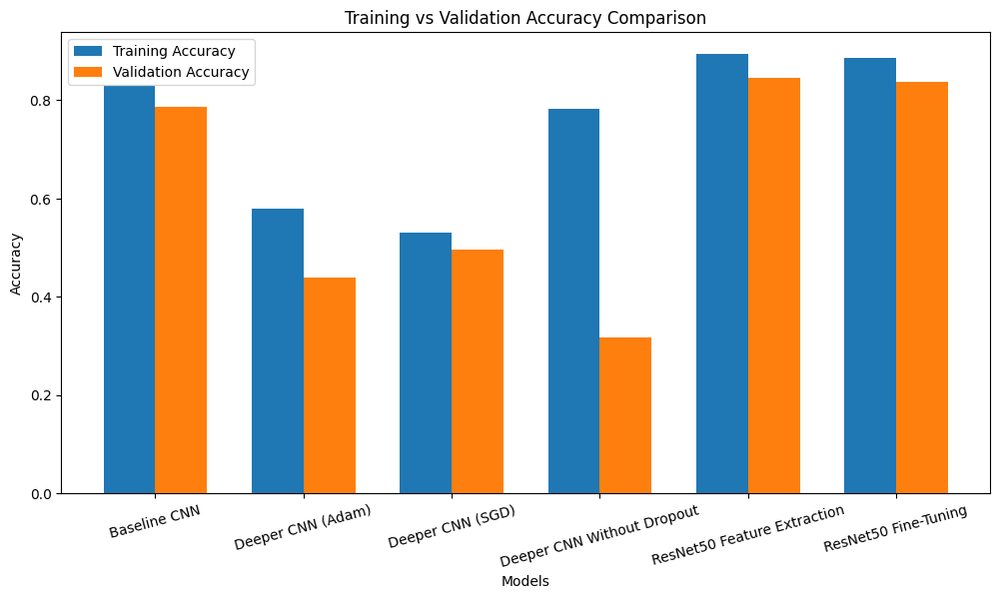

In [135]:
# Visualize training and validation accuracy comparison
x = np.arange(len(accuracy_comparison_df))

width = 0.35

plt.figure(figsize=(12, 6))

plt.bar(
    x - width / 2,
    accuracy_comparison_df["Best Training Accuracy"],
    width,
    label="Training Accuracy"
)

plt.bar(
    x + width / 2,
    accuracy_comparison_df["Best Validation Accuracy"],
    width,
    label="Validation Accuracy"
)

plt.xticks(
    x,
    accuracy_comparison_df["Model"],
    rotation=15
)

plt.xlabel("Models")
plt.ylabel("Accuracy")
plt.title("Training vs Validation Accuracy Comparison")

plt.legend()

plt.show()

In [136]:
# Save all training histories to Google Drive

pd.DataFrame(baseline_history.history).to_csv(
    "/content/drive/MyDrive/baseline_history.csv",
    index=False
)

pd.DataFrame(deeper_history.history).to_csv(
    "/content/drive/MyDrive/deeper_adam_history.csv",
    index=False
)

pd.DataFrame(sgd_history.history).to_csv(
    "/content/drive/MyDrive/deeper_sgd_history.csv",
    index=False
)

pd.DataFrame(ablation_history.history).to_csv(
    "/content/drive/MyDrive/ablation_history.csv",
    index=False
)

pd.DataFrame(resnet_history.history).to_csv(
    "/content/drive/MyDrive/resnet_feature_extraction_history.csv",
    index=False
)

pd.DataFrame(fine_tune_history.history).to_csv(
    "/content/drive/MyDrive/resnet_finetune_history.csv",
    index=False
)

print("All training histories saved successfully.")

All training histories saved successfully.
